In [1]:
from torch.utils.data import Dataset
import torch
import torch.nn as nn
import math
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader, random_split
from torch.optim.lr_scheduler import StepLR
import os
import time
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
import random
import matplotlib.pyplot as plt
import numpy as np

def normalize(tensor):
    mean = tensor.mean(dim=(0, 1), keepdim=True)
    std = tensor.std(dim=(0, 1), keepdim=True)
    return (tensor - mean) / (std + 1e-6)

def features2sentence(features):
    f_names = ['TMAX', 'TMIN', 'PREC', 'FERTZR_N', 'PDOY', 'PLANTT', 'TBKDS', 'TCSAND', 'TCSILT', 'TPH', 'TSOC']
    out_names = ["GPP", "N2O_FLUX", "ET_t", "CO2_FLUX", "Yield", "Delta_SOC"]
    assert features.size()[0] == len(f_names) + len(out_names)
    sentence = ', '.join([f"{name}: {value:.3f}" for name, value in zip(f_names, features[:len(f_names)].tolist())])
    sentence += ', '.join([f"{name}: {value:.3f}" for name, value in zip(out_names, features[len(f_names):].tolist())])
    sentence += "."
    return sentence


def features2sentence_nndata_abbreviation(features):
    f_names = ['TMAX', 'TMIN', 'PREC', 'FERTZR_N', 'PDOY', 'PLANTT', 'TBKDS', 'TCSAND', 'TCSILT', 
               'TPH', 'TSOC', 'Reco','GPP',"CO2_FLUX", "Yield", "Delta_SOC", 'N2O_FLUX','NH4_1',
               'NO3_1','NO3_3','NO3_5', 'TMAX_SOIL_1','TMIN_SOIL_1', 'TMAX_SOIL_3','TMIN_SOIL_3',
               'TMAX_SOIL_5','TMIN_SOIL_5', 'WTR_1','WTR_3','WTR_5', 'ET_t']
    assert features.size()[0] == len(f_names)
    sentence = ', '.join([f"{name}: {value:.3f}" for name, value in zip(f_names, features.tolist())])
    sentence += "."
    return sentence

def features2sentence_nndata_descriptions(features):
    feature_info = {
        'TMAX': ('Max air temperature', '°C'),
        'TMIN': ('Min air temperature', '°C'),
        'PREC': ('Precipitation', 'mm day-1'),
        'FERTZR_N': ('N fertilizer applied', 'g N m-2'),
        'PDOY': ('Plant day of the year', 'day'),
        'PLANTT': ('Plant temperature', '°C'),
        'TBKDS': ('Depth weighted averaged bulk density in soil profile', 'Mg m-3'),
        'TCSAND': ('Depth weighted averaged sand content in soil profile', 'g kg-1'),
        'TCSILT': ('Depth weighted averaged silt content in soil profile', 'g kg-1'),
        'TPH': ('Depth weighted averaged pH in soil profile', 'unitless'),
        'TSOC': ('Depth weighted averaged soil organic carbon in soil profile', 'g C kg-1'),
        'Reco': ('Ecosystem respiration', 'g C m-2 day-1'),
        'GPP': ('Gross primary productivity', 'g C m-2 day-1'),
        'CO2_FLUX': ('CO2 flux at the soil surface', 'g C m-2 day-1'),
        'Yield': ('Crop yield', 'kg ha-1'),
        'Delta_SOC': ('Change in soil organic carbon', 'g C m-2'),
        'N2O_FLUX': ('N2O flux at the soil surface', 'g N m-2 day-1'),
        'NH4_1': ('Total NH4+ + NH3 concentration in soil layer 1, 5cm depth', 'g/Mg'), ## llc fixed 06/09/2024, unit changed
        'NO3_1': ('Total NO3- + NO2- concentration in soil layer 1, 5cm depth', 'g/Mg'), 
        'NO3_3': ('Total NO3- + NO2- concentration in soil layer 3, 15cm depth', 'g/Mg'),
        'NO3_5': ('Total NO3- + NO2- concentration in soil layer 5, 28cm depth', 'g/Mg'),
        'TMAX_SOIL_1': ('The maximum temperature in soil layer 1, 5cm depth', '°C'),
        'TMIN_SOIL_1': ('The minimum temperature in soil layer 1, 5cm depth', '°C'),
        'TMAX_SOIL_3': ('The maximum temperature in soil layer 3, 15cm depth', '°C'),
        'TMIN_SOIL_3': ('The minimum temperature in soil layer 3, 15cm depth', '°C'),
        'TMAX_SOIL_5': ('The maximum temperature in soil layer 5, 28cm depth', '°C'),
        'TMIN_SOIL_5': ('The minimum temperature in soil layer 5, 28cm depth', '°C'),
        'WTR_1': ('Volumetric water content in soil layer 1, 5cm depth', 'm³ m-3'),
        'WTR_3': ('Volumetric water content in soil layer 3, 15cm depth', 'm³ m-3'),
        'WTR_5': ('Volumetric water content in soil layer 5, 28cm depth', 'm³ m-3'),
        'ET_t': ('Evapotranspiration rate', 'mm day-1')
    }
    
    assert features.size()[0] == len(feature_info)
    
    sentence = ', '.join([f"{feature_info[name][0]}: {value:.3f} {feature_info[name][1]}" for name, value in zip(feature_info.keys(), features.tolist())])
    sentence += "."
    return sentence


class CustomDataset(Dataset):
    def __init__(self, data, labels):
        """
        data: The input features concatenated as per your requirement.
        labels: The labels concatenated accordingly.
        Note: Expecting data and labels to be 3D tensors where the iteration is intended over the second dimension of data.
        """
        self.data = data
        self.labels = labels

    def __len__(self):
        # Return the length of the second dimension, as you want to iterate over it
        return self.data.shape[1]

    def __getitem__(self, idx):
        # Fetch slices across all elements in the first dimension for the given index in the second dimension
        # This gives you a setup where each "item" is effectively a column slice through the first dimension
        return self.data[:, idx, :], self.labels[:, idx, :]

def my_collate(data_in):
    X_data = []
    y_data = []
    for seq in data_in:
        X_data.append(seq[0])
        y_data.append(seq[1])
    X_data = torch.stack(X_data, dim=1)
    y_data = torch.stack(y_data, dim=1)
    return X_data, y_data


class CustomDataset_classification(Dataset):
    def __init__(self, data, labels):
        """
        data: The input features concatenated as per your requirement.
        labels: The labels concatenated accordingly.
        Note: Expecting data and labels to be 3D tensors where the iteration
              is intended over the second dimension of data.
        """
        self.data = data
        self.labels = labels

    def __len__(self):
        # Return the length of the second dimension, as you want to iterate over it
        return self.data.shape[1]

    def __getitem__(self, idx):
        # Fetch slices across all elements in the first dimension for the given index in the second dimension
        # This gives you a setup where each "item" is effectively a column slice through the first dimension
        return self.data[:, idx, :], self.labels[idx, :]
    
class R2Loss(nn.Module):
    #calculate coefficient of determination
    def forward(self, y_pred, y):
        var_y = torch.var(y, unbiased=False)
        return 1.0 - F.mse_loss(y_pred, y, reduction="mean") / var_y
def get_gpu_memory():
  _output_to_list = lambda x: x.decode('ascii').split('\n')[:-1]

  ACCEPTABLE_AVAILABLE_MEMORY = 1024
  COMMAND = "nvidia-smi --query-gpu=memory.free --format=csv"
  memory_free_info = _output_to_list(sp.check_output(COMMAND.split()))[1:]
  memory_free_values = [int(x.split()[0]) for i, x in enumerate(memory_free_info)]
  print(memory_free_values)
  return memory_free_value
    
#spin-up: bsz0 is number of year of data_sp you provided for spin up; bsz0=-1 means data_sp=[]
#data_sp is the data you provided
#return inihidden for simulation period with first year spin-uped
def spinup(model,data_sp,cycle,bsz):
    inihidden0=model1.init_hidden(bsz)
    for c in range(cycle):
        output_dummy,inihidden0 = model(data_sp,inihidden0)
    return inihidden0
def my_loss(output, target):
    loss = torch.mean((output - target)**2)
    return loss
#for multi-task learning, sumloss
def myloss_mul_sum(output, target,loss_weights):
    loss = 0.0
    nout=output.size(2)
    for i in range(nout):
        loss = loss + loss_weights[i]*torch.mean((output[:,:,i] - target[:,:,i])**2)
    return loss
def scalar_maxmin(X):
    return (X - X.min())/(X.max() - X.min()),X.min(),X.max()

#generate input combine statini 
#x should be size of [seq,batch,n_f1], statini be size of [1,batch,n_f2]
def load_ini(x,x_ini):
    nrep = x.size(0)
    x_ini=x_ini[0,:,:].view(1,x_ini.size(1),x_ini.size(2))
    return torch.cat((x,x_ini.repeat(nrep,1,1)),2)

def get_ini(x,ind,nout):
    initials=[]
    for i in range(len(ind)):
        initials.append(x[:,:,ind[i]].view(x.size(0),x.size(1),nout[i]))
    return initials

def Z_norm(X):
    X_mean=X.mean()
    X_std=np.std(np.array(X))
    return (X-X_mean)/X_std, X_mean, X_std

def Z_norm_reverse(X,Xscaler,units_convert):
    return (X*Xscaler[1]+Xscaler[0])*units_convert

def Z_norm_with_scaler(X,Xscaler):
    return (X-Xscaler[0])/Xscaler[1]

def reverse_Z_norm(Z, X_mean, X_std):
    X_original = Z * X_std + X_mean
    return X_original

In [2]:
start=1
end=18
Tx=365 #timesteps
tyear=end-start+1

class MW_Dataset1(Dataset):
    def __init__(self, set="train", module_name="Nitrogen"):
        self.fln = 0
        self.sln = 0
        self.n_f = 0
        self.n_out = 0
        self.fn_ind = 0
        self.stat_ind = []
        self.flux_ind = []
        self.X_feature_names, self.Y_feature_names = None, None
        # out_names=["GPP", "N2O_FLUX", "ET_t"]
        # out_names_annual = ["Yield", "Delta_SOC"]
        self.x_not_scaled, self.y_not_scaled = None, None
        self.X_train, self.X_val, self.X_test, self.Y_train, self.Y_val, self.Y_test = self.load_data(module_name)
        
        
    
    def __len__(self):
        return self.X.size(0)

    def __getitem__(self, idx):
        return 
    
    def load_data(self, module_name):
        
        if module_name == "Carbon":
            out_names=['ECO_RA','ECO_RH', 'ECO_GPP','ECO_HVST_C','RESIDUE_C','HUMUS_C', 'ECO_LAI', "CO2_FLUX"]
        elif module_name == "Nitrogen":
            out_names=['N2O_FLUX','NH4_1','NO3_1','NO3_3','NO3_5']
        elif module_name == "Water":
            out_names=['WTR_1','WTR_3','WTR_5', 'ET']
        elif module_name == "Thermal":
            out_names=['TMAX_SOIL_1','TMIN_SOIL_1', 'TMAX_SOIL_3','TMIN_SOIL_3','TMAX_SOIL_5','TMIN_SOIL_5']
        elif module_name == "Combined":
            out_names=['ECO_GPP','ECO_HVST_C', 'ECO_LAI', 'CO2_FLUX', 'RESIDUE_C', 'HUMUS_C', 'N2O_FLUX', 'ET']
        else:
            print("module_name is not specified")
        units_convert=[-1000.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0] # to similar scale, mg N m-2, gO2 m-2, mg N m-2
        #out_names='N2O_FLUX'
        self.n_out = n_out=len(out_names)
        #'ATM_CO2' constant, AMENDED_C 0, fire n2o,'FIRE_CH4','STG_DEAD, total 25
        f_names_c=['RESIDUE_C','HUMUS_C','LITTER_C','CO2_FLUX','O2_FLUX','AUTO_RESP','MICRO_C','SURF_RES','CH4_FLUX',\
                'SURF_DOC_FLUX','SUBS_DOC_FLUX','SURF_DIC_FLUX','SUBS_DIC_FLUX','NBP','SOC_1','SOC_3','SOC_5',\
                'H2_FLUX','ECO_HVST_C','ECO_LAI','ECO_GPP','ECO_RA','ECO_NPP','ECO_RH','TTL_DIC']

        #constant:ACTV_LYR,'SURF_ICE',total 16
        f_names_w=['ET','RUNOFF','WATER','DISCHG','SNOWPACK','WTR_1','WTR_3','WTR_5','SURF_WTR','ICE_1','ICE_2','ICE_3',\
                'PSI_1','PSI_3','PSI_5','WTR_TBL']


        #constant:FIRE_N,total 24
        f_names_n=['RESIDUE_N','HUMUS_N','FERTZR_N','NET_PL_EXCH_N','NH4','NO3','SURF_DON_FLUX','SUBS_DON_FLUX','SURF_DIN_FLUX',\
                'SUBS_DIN_FLUX','N2O_FLUX','NH3_FLUX','N2_FIXN','MICRO_N','NH4_1','NH4_3','NH4_5',\
                'NO3_1','NO3_3','NO3_5','NH4_RES','NO3_RES','ECO_HVST_N','N2_FLUX'] ######### data include the N2O_FLUX!!!!!!!!


        #constant:,total 19
        f_names_e=['RADN','TMAX_AIR','TMIN_AIR','HMAX_AIR','HMIN_AIR','WIND','PRECN','TMAX_SOIL_1','TMIN_SOIL_1',\
                'TMAX_SOIL_3','TMIN_SOIL_3','TMAX_SOIL_5','TMIN_SOIL_5','TMAX_LITTER','TMIN_LITTER','ECND_1','ECND_3','ECND_5',\
                'TTL_SALT_DISCHG']

        #soil property total 15 with variation in new results
        fp_names=['TSN','FBCU','PDOY','PDS','PDD','DDOY','PLANTT',\
                'LAT','TLB','TBKDS', 'TCSAND', 'TCSILT', 'TPH', 'TCEC', 'TSOC']

        f_names0=f_names_c+f_names_w+f_names_n+f_names_e+fp_names

        f_names = ['TMAX_AIR','TMIN_AIR', 'PRECN', 'FERTZR_N', 'PDOY', 'PLANTT', 'TBKDS', 'TCSAND', 'TCSILT', 'TPH', 'TSOC']
        self.X_feature_names = f_names

        n_f0 = len(f_names0)
        self.n_f = n_f = len(f_names)
        ind=[]
        for i in range(n_f):
            ind.append(f_names0.index(f_names[i]))
            
        #ind=sorted(ind)
        f_names=[]
        for i in ind:
            f_names.append(f_names0[i])

        self.fn_ind = fn_ind = f_names.index('FERTZR_N')
        print(fn_ind)

        self.fln = fln=20 #20 for full 0-300, 15 for 80-240
        self.sln = sln=99
        bsz0=fln*sln
        X=np.zeros([Tx*tyear,bsz0,n_f0],dtype=np.float32)
        Y=np.zeros([Tx*tyear,bsz0,n_out],dtype=np.float32)
        Xscaler=np.zeros([n_f0,2])
        Yscaler=np.zeros([n_out,2])
        #load ecosys results
        basic_path='data_files/t0_mw/' ############# llc fixed 06/09/2024, only for data source
        path_load = basic_path+'99points_metrix_scaled1_v9_X_part1.sav'
        data0=torch.load(path_load, weights_only=False)
        X[:,:,0:45]=data0['InputX']
        Xscaler[0:45,:]=data0['Xscaler']
        path_load = basic_path+'99points_metrix_scaled1_v9_X_part2.sav'
        data0=torch.load(path_load, weights_only=False)
        X[:,:,45:84]=data0['InputX']
        Xscaler[45:84,:]=data0['Xscaler']
        #read soil properties:
        path_load = basic_path+'99points_statv_v3_scaled1.sav'
        data0=torch.load(path_load, weights_only=False)
        X[:,:,84:n_f0]=data0['Soil_p']
        Xscaler[84:n_f0,:]=data0['Soil_p_scaler']
        #use Z-norm to rescale every parameters
        #Z-norm for Y
        indout=[]
        for i in range(n_out):
            indout.append(f_names0.index(out_names[i]))
        Y[:,:,:]=X[:,:,indout]
        #self.y_not_scaled = np.zeros([Tx*tyear,bsz0,n_out],dtype=np.float32)
        #self.y_not_scaled1 = np.zeros([Tx*tyear,bsz0,n_out],dtype=np.float32) ############# llc fixed 06/09/2024
       # self.y_not_scaled2 = np.zeros([Tx*tyear,bsz0,n_out],dtype=np.float32)
        for i in range(n_out):
           # self.y_not_scaled[:,:,i] = Y[:,:,i]
            Y[:,:,i]=(Y[:,:,i]*(Xscaler[indout[i],1]-Xscaler[indout[i],0])+Xscaler[indout[i],0]) # convert back
            #self.y_not_scaled[:,:,i] = Y[:,:,i]
           # Y[:,:,i],Yscaler[i,0],Yscaler[i,1]=Z_norm(Y[:,:,i])
            #self.y_not_scaled2[:,:,i] = Y[:,:,i]
        #Z-norm for X
        X=X[:,:,ind]
        Xscaler=Xscaler[ind,:]
        self.x_not_scaled = np.zeros([Tx*tyear,bsz0,n_f],dtype=np.float32) ######## llc fixed 06/09/2024, n_f0-->n_f
        #self.x_not_scaled1 = np.zeros([Tx*tyear,bsz0,n_f],dtype=np.float32) ######## llc fixed 06/09/2024, n_f0-->n_f
        #self.x_not_scaled2 = np.zeros([Tx*tyear,bsz0,n_f],dtype=np.float32)
        print(len(ind),n_f,self.x_not_scaled.shape)
        for i in range(len(ind)):
           # self.x_not_scaled[:,:,i] = X[:,:,i]
            X[:,:,i]=(X[:,:,i]*(Xscaler[i,1]-Xscaler[i,0])+Xscaler[i,0]) # convert back
            self.x_not_scaled[:,:,i] = X[:,:,i]
            #X[:,:,i],Xscaler[i,0],Xscaler[i,1]=Z_norm(X[:,:,i])  
            #self.x_not_scaled2[:,:,i] = X[:,:,i]
        
        self.Y_feature_names = out_names ###llc fixed 06/09/2024

        if module_name == "Carbon":
         ##   for i in range(n_out):  ######## llc fixed 06/09/2024, n_f0-->n_f
                ## Y[:,:,i] = reverse_Z_norm(Y[:,:,i], Yscaler[i,0],Yscaler[i,1])
            Y_temp = np.zeros([Tx*tyear,bsz0,5],dtype=np.float32)
            # Reco ('ECO_RA' + 'ECO_RH', daily)
            Y_temp[:,:,0] = Y[:,:,0] + Y[:,:,1]
            # GPP ('ECO_GPP', daily)
            Y_temp[:,:,1] = Y[:,:,2]
            # CO2_flux ('ECO_GPP', daily)
            Y_temp[:,:,2] = Y[:,:,7]
            # Yield ('ECO_HVST_C', annual sum, annually)
            data_by_year = Y[:,:,3].reshape(tyear, Tx, Y[:,:,3].shape[1])
            yearly_sums = data_by_year.sum(axis=1)  # Sum across days for each year, results in (18, 1980, 1)
            yearly_sums_repeated = np.repeat(yearly_sums, Tx, axis=0)  # Repeat each year's sum 365 times
            Y_temp[:,:,3] = yearly_sums_repeated
            # ΔSOC (This year DOY 363 ('RESIDUE_C' + 'HUMUS_C'), minus DOY 2nd day that value, annually)
            soc = Y[:,:,4] + Y[:,:,5]
            data_by_year = soc.reshape(tyear, Tx, soc.shape[1])
            doy_363_values = data_by_year[:, 362, :]  
            doy_2_values = data_by_year[:, 1, :]      
            yearly_differences = doy_363_values - doy_2_values
            yearly_differences_repeated = np.repeat(yearly_differences, Tx, axis=0)
            Y_temp[:,:,4] = yearly_differences_repeated
            
            self.Y_feature_names = ['Reco','GPP', "CO2_FLUX", "Yield", "Delta_SOC"] ###llc fixed 06/09/2024
        
          ##  Y=np.zeros([Tx*tyear,bsz0,5],dtype=np.float32) ######## llc fixed 06/09/2024
           ## Yscaler=np.zeros([5,2])
           ## for i in range(5):
            ##    Y[:,:,i],Yscaler[i,0],Yscaler[i,1]=Z_norm(Y_temp[:,:,i]) ######## llc fixed 06/09/2024
            Y = Y_temp
            n_out = 5
            self.n_out = n_out
        elif module_name == "Combined":
           ## for i in range(n_out):
           ##     Y[:,:,i] = reverse_Z_norm(Y[:,:,i], Yscaler[i,0],Yscaler[i,1]) ######## llc fixed 06/09/2024
            Y_temp = np.zeros([Tx*tyear,bsz0, 6],dtype=np.float32)
            # GPP ('ECO_GPP', daily)
            Y_temp[:,:,0] = Y[:,:,0]
            # N2O_FLUX ('N2O_FLUX', daily)
            Y_temp[:,:,1] = Y[:,:,6]
            # ET ('ET', daily)
            Y_temp[:,:,2] = Y[:,:,7]
            # CO2_FLUX ('CO2_FLUX', daily)
            Y_temp[:,:,3] = Y[:,:,3]
            # Yield ('ECO_HVST_C', annual sum, annually)
            data_by_year = Y[:,:,2].reshape(tyear, Tx, Y[:,:,2].shape[1])
            yearly_sums = data_by_year.sum(axis=1)  # Sum across days for each year, results in (18, 1980, 1)
            yearly_sums_repeated = np.repeat(yearly_sums, Tx, axis=0)  # Repeat each year's sum 365 times
            Y_temp[:,:,4] = yearly_sums_repeated
            # ΔSOC (This year DOY 363 ('RESIDUE_C' + 'HUMUS_C'), minus DOY 2nd day that value, annually)
            soc = Y[:,:,4] + Y[:,:,5]
            data_by_year = soc.reshape(tyear, Tx, soc.shape[1])
            doy_363_values = data_by_year[:, 362, :]  
            doy_2_values = data_by_year[:, 1, :]      
            yearly_differences = doy_363_values - doy_2_values
            yearly_differences_repeated = np.repeat(yearly_differences, Tx, axis=0)
            Y_temp[:,:,5] = yearly_differences_repeated
            # # LAI ('ECO_LAI', daily)
            # Y_temp[:,:,5] = Y[:,:,6]
           # Y=np.zeros([Tx*tyear,bsz0,6],dtype=np.float32) ######## llc fixed 06/09/2024
           # Yscaler=np.zeros([6,2])
            self.Y_feature_names = ["GPP", "N2O_FLUX", "ET", "CO2_FLUX", "Yield", "Delta_SOC"]
           ## for i in range(6):
           ##     Y[:,:,i],Yscaler[i,0],Yscaler[i,1]=Z_norm(Y_temp[:,:,i]) ######## llc fixed 06/09/2024
            Y = Y_temp
            n_out = 6
            self.n_out = n_out   
            
        self.y_not_scaled = Y
        
        Y=torch.from_numpy(Y)
        X=torch.from_numpy(X)
        
        ###### llc fixed 06/09/2024,do not do this anymore 
        '''    
        #need to change to new Z_norm
        W_names=['TMAX_AIR','TMIN_AIR',]
        Diff_names=['TDIF_AIR']
        W_ind=[]
        for i in range(len(W_names)):
            W_ind.append(f_names.index(W_names[i]))
        #replace max-min
        for i in range(len(Diff_names)):
            Vmax=X[:,:,W_ind[i*2]]*Xscaler[W_ind[i*2],1]+Xscaler[W_ind[i*2],0]
            Vmin=X[:,:,W_ind[i*2+1]]*Xscaler[W_ind[i*2+1],1]+Xscaler[W_ind[i*2+1],0] 
            X[:,:,W_ind[i*2+1]]=Vmax-Vmin
            X[:,:,W_ind[i*2+1]],Xscaler[W_ind[i*2+1],0],Xscaler[W_ind[i*2+1],1]=Z_norm(X[:,:,W_ind[i*2+1]])
            f_names[W_ind[i*2+1]]=Diff_names[i]
        '''    

        train_n=70
        val_n=10
        test_n=19

        num_years = end - start + 1  # Number of years in the dataset
        days_per_year = 365
        
        # Reshape the data to have a year dimension
        X_yearly = X.view(num_years, days_per_year, bsz0, n_f)
        Y_yearly = Y.view(num_years, days_per_year, bsz0, n_out)

        train_years = int(num_years * 0.8)
        val_years = int(num_years * 0.1)
        
        X_train = X_yearly[:train_years].contiguous().view(-1, bsz0, n_f)
        X_val = X_yearly[train_years:train_years + val_years].contiguous().view(-1, bsz0, n_f)
        X_test = X_yearly[train_years + val_years:].contiguous().view(-1, bsz0, n_f)

        Y_train = Y_yearly[:train_years].contiguous().view(-1, bsz0, n_out)
        Y_val = Y_yearly[train_years:train_years + val_years].contiguous().view(-1, bsz0, n_out)
        Y_test = Y_yearly[train_years + val_years:].contiguous().view(-1, bsz0, n_out)

        if module_name == "Carbon":
            flux_vars=[]
            # Change it to 6 output
            # The name itself doesn't match since we are only using the len(stat_vars)
            stat_vars=['ECO_RA','ECO_RH', 'ECO_GPP', 'ECO_HVST_C', "CO2_FLUX"]
        elif module_name == "Nitrogen":
            # Treating FLUX as normal variable 
            flux_vars=[]
            stat_vars=['N2O_FLUX', 'NH4_1', 'NO3_1','NO3_3','NO3_5']
        elif module_name == "Water":
            flux_vars=[]
            stat_vars=['WTR_1','WTR_3','WTR_5', 'ET']
        elif module_name == "Thermal":
            flux_vars=[]
            stat_vars=['TMAX_SOIL_1','TMIN_SOIL_1', 'TMAX_SOIL_3','TMIN_SOIL_3','TMAX_SOIL_5','TMIN_SOIL_5']
        elif module_name == "Combined":
            # Treating FLUX as normal variable 
            flux_vars=[]
            stat_vars=['CO2_FLUX', 'N2O_FLUX', 'ECO_HVST_C','ECO_GPP', 'ECO_LAI', 'RESIDUE_C', 'HUMUS_C', 'ET']
        else:
            print("module_name is not specified")
        flux_ind=[]
        for i in range(len(flux_vars)):
            flux_ind.append(out_names.index(flux_vars[i]))
        stat_ind=[]
        for i in range(len(stat_vars)):
            stat_ind.append(out_names.index(stat_vars[i]))
        
        self.flux_ind = flux_ind
        self.stat_ind = stat_ind
        #loss weights setup

        return X_train, X_val, X_test, Y_train, Y_val, Y_test


In [3]:
mw_data = MW_Dataset1(module_name="Combined")

3
11 11 (6570, 1980, 11)


In [4]:
mw_data.x_not_scaled.shape

(6570, 1980, 11)

In [5]:
class DayCent_Dataset1(Dataset):
    def __init__(self, set="train", module_name="Nitrogen"):
        self.fln = 0
        self.sln = 0
        self.n_f = 0
        self.n_out = 0
        self.fn_ind = 0
        self.stat_ind = []
        self.flux_ind = []
        self.annual_feature_ind = []
        self.X_feature_names, self.Y_feature_names = None, ["GPP", "N2O_FLUX", "ET_t", "Yield", "Delta_SOC"]
        # self.X_train, self.X_val, self.X_test, self.Y_train, self.Y_val, self.Y_test = self.load_data(module_name)
        # Scenarios = ["C_S_150N_Planting", "C_S_150N_30afPlanting", "S_C_150N_Planting", "S_C_150N_30afPlanting"]
        Scenarios = ["C_S_150N_Planting"]
        
        self.X_train, self.X_val, self.X_test, self.Y_train, self.Y_val, self.Y_test, self.x_not_scaled, self.y_not_scaled = self.combined_scenerios(module_name, Scenarios)
    
    def __len__(self):
        return self.X.size(0)

    def __getitem__(self, idx):
        return 
    
    def combined_scenerios(self, module_name, Scenarios):
        X_list, Y_list = [], []
        for s in Scenarios:
            print(s)
            print(module_name)
            tx, ty = self.load_data(module_name, Scenario=s)
            X_list.append(tx)
            Y_list.append(ty)
            print(tx.size(), ty.size())
        X = torch.cat(X_list, dim=1)
        Y = torch.cat(Y_list, dim=1)
        print(X.size(), Y.size())

        # Apply Z norm
        Xscaler=np.zeros([len(self.X_feature_names),2])
        Yscaler=np.zeros([len(self.Y_feature_names),2])

        x_not_scaled = X.clone().detach() ### llc fixed 06/09/2024, add .clone().detach(), or it will change after following
        y_not_scaled = Y.clone().detach() ### llc fixed 06/09/2024
      #  for i in range(len(self.X_feature_names)):   ### llc fixed 06/09/2024, always return unscaled features
      #      X[:,:,i],Xscaler[i,0],Xscaler[i,1]=Z_norm(X[:,:,i])
     #   for i in range(len(self.Y_feature_names)):
      #      Y[:,:,i],Yscaler[i,0],Yscaler[i,1]=Z_norm(Y[:,:,i])
      #  self.x_not_scaled1 = X
      #  self.y_not_scaled1 = Y
         # Constants
        start_year = 2000
        end_year = 2020
        days_per_year = 365
        X_feature_names = self.X_feature_names
        Y_feature_names = self.Y_feature_names
        # Reshape the data to have a year dimension
        
        num_years = end_year - start_year + 1
        print(X_feature_names)
        print(X.size())
        X_yearly = X.view(num_years, days_per_year, X.shape[1], len(X_feature_names))
        Y_yearly = Y.view(num_years, days_per_year, X.shape[1], len(Y_feature_names))

        # Split the dataset by year for train, validation, and test
        train_years = int(num_years * 0.8)
        val_years = int(num_years * 0.1)
        test_years = num_years - train_years - val_years

        X_train = X_yearly[:train_years].contiguous().view(-1, X.shape[1], len(X_feature_names))
        X_val = X_yearly[train_years:train_years + val_years].contiguous().view(-1, X.shape[1], len(X_feature_names))
        X_test = X_yearly[train_years + val_years:].contiguous().view(-1, X.shape[1], len(X_feature_names))

        Y_train = Y_yearly[:train_years].contiguous().view(-1, X.shape[1], len(Y_feature_names))
        Y_val = Y_yearly[train_years:train_years + val_years].contiguous().view(-1, X.shape[1], len(Y_feature_names))
        Y_test = Y_yearly[train_years + val_years:].contiguous().view(-1, X.shape[1], len(Y_feature_names))
        print(X_train.size(), X_val.size(), X_test.size(), Y_train.size(), Y_val.size(), Y_test.size())

        return X_train, X_val, X_test, Y_train, Y_val, Y_test, x_not_scaled, y_not_scaled

    def load_data(self, module_name, Scenario='C_S_150N_Planting'):
        
        # Output: 
        # Carbon: Reco, (NEE), (GPP), (Yield), (ΔSOC) (top 30cm, green means definition is not totally same), (LAI) (NO LAI, red meas no such data)
        # Nitrogen: (N2O), [NH4] (only one value from top 10cm soil, NH4_1; Missing NH4_3, NH4_5), [NO3] (5cm, 20cm, 30cm),
        # Water: SWC_1, 3, 5 (5cm, 20cm, 30cm), (ET, no negative value, to atmosphere) 
        # Thermal: Tsoil_1, 3, 5 (5cm, 20cm, 30cm)

        # Input: 
        # Weather: TMAX, TMIN, PREC, RADN, max HUMIDITY, min humidity, WIND; (weather filling with NLDAS)
        # Soil: 'TBKDS', 'TCSAND', 'TCSILT', 'TPH','TSOC','TFC','TWP','TKSat' (blue represents which ecosys model data does not include)
        # Management: FERTZR_N','PDOY','PLANTT','HDOY'
        # Other: 'LAT','LON','ELEV'
        # Soil initials after spin up: not included. But may affect the performance. Not available in read data
        
        data_dir = 'data_files/t0_dc/' ###llc fixed 06/09/2024

        # Constants
        start_year = 2000
        end_year = 2020
        days_per_year = 365  # ignoring leap year days

        # Determine the total number of days from 2000 to 2020, ignoring leap days
        total_days = (end_year - start_year + 1) * days_per_year

        ##################
        # Input features #
        ##################
        X = np.load(data_dir+'datadic_dynamic_input_'+Scenario+'.npy',allow_pickle=True).item() ###llc fixed 06/09/2024
        X_value_dynamic = np.array(list(X.values()))
        X_value_dynamic = np.transpose(X_value_dynamic, (1, 0, 2))
        # print(X_value_dynamic.shape)
        feature_columns_1_dynamic = ['TMAX','TMIN','PREC']
        feature_columns_2_dynamic = ['FERTZR_N','PDOY','PLANTT']
        feature_columns_dynamic = feature_columns_1_dynamic+feature_columns_2_dynamic
        # for count, name in enumerate(feature_columns_dynamic):
        #     print(name,'min',np.min(X_value_dynamic[:,:,count]),'max',np.max(X_value_dynamic[:,:,count]))
            
        X = np.load(data_dir+'datadic_static_input.npy',allow_pickle=True).item() ###llc fixed 06/09/2024
        X_value_static = np.array(list(X.values()))
        X_value_static = np.expand_dims(X_value_static, axis=0)
        # Step 2: Tile the array to repeat it and get the shape (7665, 2562, 11)
        X_value_static = np.tile(X_value_static, (total_days, 1, 1))
        # print(X_value_static.shape)
        feature_columns_static = ['TBKDS', 'TCSAND', 'TCSILT', 'TPH','TSOC']
        # for count, name in enumerate(feature_columns_static):
        #     print(name,'min',np.min(X_value_static[:, :,count]),'max',np.max(X_value_static[:,:,count]))

        X = np.concatenate((X_value_dynamic[:, :, :6], X_value_static[:, :, :5]), axis=2)
        X_feature_names = feature_columns_dynamic + feature_columns_static
        # for count, name in enumerate(feature_columns):
        #     print(name,'min',np.min(X_value[:, :,count]),'max',np.max(X_value[:,:,count]))

        ###################
        # Output features #
        ###################
        out_names_annual = []
        if module_name == "Carbon":
            out_names=['Reco','GPP', "CO2_FLUX"]
            out_names_annual = ["Yield", "Delta_SOC"]
            self.flux_ind = []
            self.stat_ind = [0, 1, 2, 3, 4]
        elif module_name == "Nitrogen":
            out_names=['N2O_FLUX','NH4_1','NO3_1','NO3_3','NO3_5']
            self.flux_ind = []
            self.stat_ind = [0, 1, 2, 3, 4]
        elif module_name == "Water":
            out_names=['WTR_1','WTR_3','WTR_5', 'ET_t', 'ET_e'] ###llc fixed 06/09/2024
            self.flux_ind = []
            self.stat_ind = [0, 1, 2, 3]
        elif module_name == "Thermal":
            out_names=['TMAX_SOIL_1','TMIN_SOIL_1', 'TMAX_SOIL_3','TMIN_SOIL_3','TMAX_SOIL_5','TMIN_SOIL_5']
            self.flux_ind = []
            self.stat_ind = [0, 1, 2, 3, 4, 5]
        elif module_name == "Combined":
            out_names=["GPP", "N2O_FLUX", "ET_t", "CO2_FLUX", "ET_e"] ###llc fixed 06/09/2024
            out_names_annual = ["Yield", "Delta_SOC"]
            self.flux_ind = []
            self.stat_ind = [0,1, 2, 3, 4, 5]
        else:
            print("module_name is not specified")
        
        # NEE is CO2_FlUX
        feature_columns = ['ET_t', 'ET_e', 'CO2_FLUX', 'N2O_FLUX','WTR_1', 'WTR_3', 'WTR_5','TMIN_SOIL_1', 'TMIN_SOIL_3', 
                           'TMIN_SOIL_5', 'TMAX_SOIL_1', 'TMAX_SOIL_3', 'TMAX_SOIL_5','NH4_1', 'NO3_1',  'NO3_3', 'NO3_5',
                           'Reco', 'GPP']
        Y = np.load(data_dir+'datadic_'+Scenario+'.npy',allow_pickle=True).item() ###llc fixed 06/09/2024
        Y_value = np.array(list(Y.values()))
        Y_final = np.zeros((Y_value.shape[0], Y_value.shape[1], len(out_names) + len(out_names_annual)))
        for count, name in enumerate(feature_columns):
            if name in out_names:
                Y_final[:,:,out_names.index(name)] = Y_value[:,:,count]
        
        ###llc fixed 06/09/2024, some feature will have different positive direction, 
        ###ET = (ET_t + ET_e); N2O_FLUX = - N2O_FLUX; Reco = - Reco. 
        if module_name == "Carbon":
            Y_final[:,:,0] = - Y_final[:,:,0] ##Reco = - Reco
        elif module_name == "Nitrogen":
            Y_final[:,:,0] = - Y_final[:,:,0]  ##N2O_FLUX = - N2O_FLUX
        elif module_name == "Water":
            Y_final_tmp = np.zeros((Y_value.shape[0], Y_value.shape[1], len(out_names) + len(out_names_annual) - 1))
            Y_final_tmp[:,:,0:3] = Y_final[:,:,0:3]
            Y_final_tmp[:,:,3] =  (Y_final[:,:,3] + Y_final[:,:,4]) ##ET = (ET_t + ET_e)
            Y_final = Y_final_tmp
            out_names = ['WTR_1','WTR_3','WTR_5', 'ET']
        elif module_name == "Combined":
            Y_final_tmp = np.zeros((Y_value.shape[0], Y_value.shape[1], len(out_names) + len(out_names_annual) - 1))
            Y_final_tmp[:,:,0] = Y_final[:,:,0]
            Y_final_tmp[:,:,1] = - Y_final[:,:,1] ##N2O_FLUX = - N2O_FLUX
            Y_final_tmp[:,:,3] = Y_final[:,:,3]
            Y_final_tmp[:,:,2] = (Y_final[:,:,2] + Y_final[:,:,2]) ##ET = (ET_t + ET_e)
            Y_final = Y_final_tmp
            out_names = ["GPP", "N2O_FLUX", "ET", "CO2_FLUX"]  ###also check positive direction of CO2 later
            
        
        # Annual data
        Y = np.load(data_dir+'datadic_'+Scenario+'_annual.npy',allow_pickle=True).item() ###llc fixed 06/09/2024
        Y_value_annual = np.array(list(Y.values()))
        # print(Y_value_annual.shape)
        feature_columns = ['dayofyr', 'crpval','Yield','Delta_SOC']
        for count, name in enumerate(feature_columns):
            if name in out_names_annual:
                Y_final[:,:,len(out_names) + out_names_annual.index(name)] = np.repeat(Y_value_annual[:,:,count], 365, axis=1)
        # print(np.repeat(Y_value_annual[:,:,count], 365, axis=1).shape)
        # for count, name in enumerate(out_names + out_names_annual):
        #     print(name,'min',np.min(Y_final[:, :,count]),'max',np.max(Y_final[:,:,count]))
        Y = np.transpose(Y_final, (1, 0, 2))
        Y_feature_names = out_names + out_names_annual
        self.X_feature_names, self.Y_feature_names = X_feature_names, Y_feature_names
        

        
        Y=torch.from_numpy(Y)
        X=torch.from_numpy(X)
        return X, Y

In [6]:
dc_data = DayCent_Dataset1(module_name="Combined")

C_S_150N_Planting
Combined
torch.Size([7665, 2562, 11]) torch.Size([7665, 2562, 6])
torch.Size([7665, 2562, 11]) torch.Size([7665, 2562, 6])
['TMAX', 'TMIN', 'PREC', 'FERTZR_N', 'PDOY', 'PLANTT', 'TBKDS', 'TCSAND', 'TCSILT', 'TPH', 'TSOC']
torch.Size([7665, 2562, 11])
torch.Size([5840, 2562, 11]) torch.Size([730, 2562, 11]) torch.Size([1095, 2562, 11]) torch.Size([5840, 2562, 6]) torch.Size([730, 2562, 6]) torch.Size([1095, 2562, 6])


In [7]:
dc_data.x_not_scaled.size()

torch.Size([7665, 2562, 11])

In [8]:
####load real data, llc fixed 06/09/2024 
###data load
basic_path = 'data_files/t1_n2o/'
path_load = basic_path + 'mesotest_data_org_v1.sav'
data0=torch.load(path_load, weights_only=False)
X1=data0['InputX1']
X2=data0['InputX2']
X3=data0['Soil_p']
Y=data0['OutputY']
print(X1.shape,X2.shape,X3.shape,Y.shape)

###llc fixed 06/09/2024, f_names matches the previous ones
out_names=['N2O_FLUX','CO2_FLUX','NO3_3','NH4_3','WTR_3']
selected_SP=['PDOY','PLANTT','TBKDS', 'TCSAND', 'TCSILT', 'TPH', 'TSOC']
#f_names=['FERTZR_N','RADN','TMAX_AIR','TMIN_AIR','HMAX_AIR','HMIN_AIR','WIND','PRECN']+selected_SP
f_names= ['TMAX_AIR','TMIN_AIR', 'PRECN', 'FERTZR_N', 'PDOY', 'PLANTT', 'TBKDS', 'TCSAND', 'TCSILT', 'TPH', 'TSOC']

###processing the data to input format
days=122
nyear=3
totnchamber=6
c_index=[0,1,2,3,4,5]
Y_units_convert=[-24.0,-24.0,1.0,1.0,(1-1.5/2.65)/100.0]
X1names = ['tair','radn','precip','humidity'] 
X2names = ['Obs_prec','Fertilizer']
X3names=['TSN','FBCU','PDOY','PDS','PDD','DDOY','PLANTT',\
                  'LAT','TLB','TBKDS', 'TCSAND', 'TCSILT', 'TPH', 'TCEC', 'TSOC']
Ynames= ['N2O_FLUX','CO2_FLUX','NO3','NH4','WFPS']

X_obs_all = np.zeros([days,nyear,len(c_index),len(f_names)],dtype=np.float32)
Y_obs_all = np.zeros([days,nyear,len(c_index),len(Ynames)],dtype=np.float32)
Y_obs_mask_all = np.zeros(Y_obs_all.shape,dtype=np.float32) 
##example for prepareing a validation site
for val_cn in c_index:
    c_val = [val_cn]
    nc_val = len(c_val)
    c_train= [x for i,x in enumerate(c_index) if i not in c_val] 
    nc_train = len(c_train)
    print(c_train)
    print(X1.shape,X2.shape,X3.shape,Y.shape)

    X_val=np.zeros([days,nyear*nc_val,len(f_names)],dtype=np.float32)
    Y_val=np.zeros([days,nyear*nc_val,len(Ynames)],dtype=np.float32)
    Y_val_mask=np.zeros(Y_val.shape,dtype=np.float32) 
    #load the validation  ###llc fixed 06/09/2024
    for d in range(days):
        for y in range(nyear):
            for c in range(nc_val):
                #temperature
                X_val[d,y*nc_val+c,0] = np.max(X1[d*24:(d+1)*24,y,c_val[c],0])
                X_val[d,y*nc_val+c,1] = np.max(X1[d*24:(d+1)*24,y,c_val[c],0])-\
                                                            np.min(X1[d*24:(d+1)*24,y,c_val[c],0])
                #precipitation
                X_val[d,y*nc_val+c,2] = X2[d,y,c_val[c],0]
                #fertilizer
                X_val[d,y*nc_val+c,3] = X2[d,y,c_val[c],1]

                #Y data
                for ffy in range(len(Ynames)): 
                    element = Y[d*24:(d+1)*24,y,c_val[c],ffy]
                    nan_nums=np.count_nonzero(np.isnan(element))
                    if  nan_nums < 16:
                        Y_val[d,y*nc_val+c,ffy] = np.nanmean(element)*Y_units_convert[ffy] #convert 
                        Y_val_mask[d,y*nc_val+c,ffy] = (24.0-float(nan_nums))/24.0
                    else:
                        Y_val[d,y*nc_val+c,ffy] = np.nan # if missing value >=16, we use nan
                        Y_val_mask[d,y*nc_val+c,ffy] = 0.0
                #deal with other training variables
                for i in range(len(selected_SP)):
                    X_val[d,y*nc_val+c,4+i] = X3[d,y,c_val[c],X3names.index(selected_SP[i])]
    print(X_val.shape,Y_val.shape)
    
    X_obs_all[:,:,val_cn,:] = X_val ###llc fixed, 06/09/2024, for all 6 chambers. [day, year, chamber, feature]
    Y_obs_all[:,:,val_cn,:] = Y_val
    Y_obs_mask_all[:,:,val_cn,:] = Y_val_mask
obs_Y_names = out_names
print(X_obs_all.shape,Y_obs_all.shape, obs_Y_names)
    #print(Xscaler.shape, Yscaler.shape,X_val.shape[2])
    # Check PLANTT (9), FERTZR_N (0)，PDOY(8)

(2928, 3, 6, 4) (122, 3, 6, 2) (122, 3, 6, 15) (2928, 3, 6, 5)
[1, 2, 3, 4, 5]
(2928, 3, 6, 4) (122, 3, 6, 2) (122, 3, 6, 15) (2928, 3, 6, 5)
(122, 3, 11) (122, 3, 5)
[0, 2, 3, 4, 5]
(2928, 3, 6, 4) (122, 3, 6, 2) (122, 3, 6, 15) (2928, 3, 6, 5)
(122, 3, 11) (122, 3, 5)
[0, 1, 3, 4, 5]
(2928, 3, 6, 4) (122, 3, 6, 2) (122, 3, 6, 15) (2928, 3, 6, 5)
(122, 3, 11) (122, 3, 5)
[0, 1, 2, 4, 5]
(2928, 3, 6, 4) (122, 3, 6, 2) (122, 3, 6, 15) (2928, 3, 6, 5)
(122, 3, 11) (122, 3, 5)
[0, 1, 2, 3, 5]
(2928, 3, 6, 4) (122, 3, 6, 2) (122, 3, 6, 15) (2928, 3, 6, 5)
(122, 3, 11) (122, 3, 5)
[0, 1, 2, 3, 4]
(2928, 3, 6, 4) (122, 3, 6, 2) (122, 3, 6, 15) (2928, 3, 6, 5)
(122, 3, 11) (122, 3, 5)
(122, 3, 6, 11) (122, 3, 6, 5) ['N2O_FLUX', 'CO2_FLUX', 'NO3_3', 'NH4_3', 'WTR_3']


## 1st check: The range of every input features original values ##

In [9]:
#####1st check: The range of every input features original values
print(mw_data.X_feature_names, dc_data.X_feature_names)
ecosys_set = mw_data.x_not_scaled ## x_not_scaled, X_train.numpy()
daycent_set = dc_data.x_not_scaled.numpy() ## x_not_scaled.numpy(), X_train.numpy()
print(ecosys_set.shape,daycent_set.shape) ######
obs_set = X_obs_all ##
n_xfeatures = len(mw_data.X_feature_names)
for i in range(n_xfeatures):
    print(mw_data.X_feature_names[i])
    print('Ecosys',"{:.2f}".format(np.max(ecosys_set[:,:,i])),\
          "{:.2f}".format(np.min(ecosys_set[:,:,i])),\
          "{:.2f}".format(np.mean(ecosys_set[:,:,i])))
    print('Daycent',"{:.2f}".format(np.max(daycent_set[:,:,i])),\
          "{:.2f}".format(np.min(daycent_set[:,:,i])),\
          "{:.2f}".format(np.mean(daycent_set[:,:,i])))
    print('RealData',"{:.2f}".format(np.max(obs_set[:,:,:,i])),\
          "{:.2f}".format(np.min(obs_set[:,:,:,i])),\
          "{:.2f}".format(np.mean(obs_set[:,:,:,i])))

['TMAX_AIR', 'TMIN_AIR', 'PRECN', 'FERTZR_N', 'PDOY', 'PLANTT', 'TBKDS', 'TCSAND', 'TCSILT', 'TPH', 'TSOC'] ['TMAX', 'TMIN', 'PREC', 'FERTZR_N', 'PDOY', 'PLANTT', 'TBKDS', 'TCSAND', 'TCSILT', 'TPH', 'TSOC']
(6570, 1980, 11) (7665, 2562, 11)
TMAX_AIR
Ecosys 47.62 -23.20 17.23
Daycent 48.05 -26.85 16.68
RealData 41.26 -2.58 27.12
TMIN_AIR
Ecosys 31.85 -32.67 7.22
Daycent 30.25 -37.45 5.17
RealData 22.95 3.37 11.27
PRECN
Ecosys 153.82 0.00 2.77
Daycent 243.70 0.00 2.86
RealData 38.64 0.00 3.27
FERTZR_N
Ecosys 33.63 0.00 0.03
Daycent 16.80 0.00 0.02
RealData 22.40 0.00 0.15
PDOY
Ecosys 1.00 0.00 0.00
Daycent 1.00 0.00 0.00
RealData 1.00 0.00 0.01
PLANTT
Ecosys 1.00 0.00 0.61
Daycent 1.00 0.00 0.52
RealData 1.00 1.00 1.00
TBKDS
Ecosys 1.57 1.31 1.44
Daycent 1.79 0.42 1.29
RealData 1.50 1.50 1.50
TCSAND
Ecosys 855.96 52.79 214.75
Daycent 936.89 13.33 164.43
RealData 49.67 16.33 28.46
TCSILT
Ecosys 721.05 95.21 535.92
Daycent 807.11 33.33 540.37
RealData 531.25 508.33 517.65
TPH
Ecosys 7.33 5

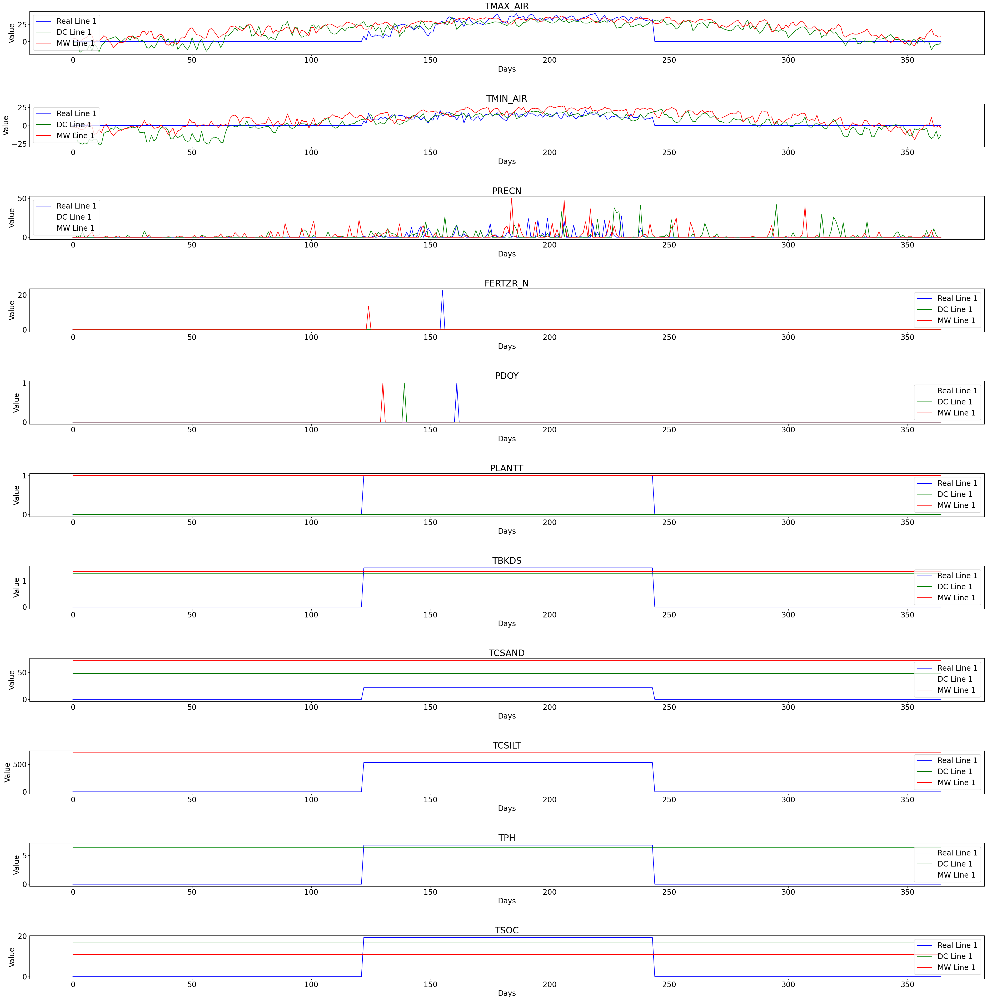

In [10]:
####1st check plot
# Prepare real data with zero padding to fit 365 days
X_obs_padded = np.zeros((365, 3, 11))
X_obs_padded[122:244, :, :] = X_obs_all[:,:,0,:] ##### first chamber

# Extract the first place and first three full years (365 days each) from DC and MW datasets
### llc fixed, reshape has problem, please avoid. it will cause temperature seanality change
#dc_data_extracted = dc_data.x_not_scaled[:365*3, 5, :].reshape(365, 3, -1).numpy() 
#mw_data_extracted = mw_data.x_not_scaled[:365*3, 5, :].reshape(365, 3, -1)
dc_data_extracted = dc_data.x_not_scaled[365*15:365*16, 5, :].numpy() ### llc fixed, fertilizer will be 0 at site 0
mw_data_extracted = mw_data.x_not_scaled[365*15:365*16, 5, :]

# Colors for each dataset
colors = ['b', 'g', 'r']  # Colors for the three different lines within each dataset

# Plotting X features that are present in both datasets
plt.rcParams.update({'font.size': 20})
fig, axes = plt.subplots(11, 1, figsize=(40, 40))
fig.tight_layout(pad=5.0)

x = np.arange(365)

for i, ax in enumerate(axes.flatten()):
    for j in range(1):
        ax.plot(x, X_obs_padded[:, j, i], color=colors[0], label=f'Real Line {j+1}')
        ax.plot(x, dc_data_extracted[:, i], color=colors[1], label=f'DC Line {j+1}')
        ax.plot(x, mw_data_extracted[:, i], color=colors[2], label=f'MW Line {j+1}')
    ax.set_title(f_names[i])
    ax.set_xlabel('Days')
    ax.set_ylabel('Value')
    ax.legend()
plt.show()

## 2st check: The range of every output features original values, in different model modes

In [11]:
#####2st check: The range of every output features original values, in different model modes
##combined
print(mw_data.Y_feature_names)
print(dc_data.Y_feature_names)
print(obs_Y_names)
ecosys_set = mw_data.y_not_scaled ## y_not_scaled, Y_train.numpy()
daycent_set = dc_data.y_not_scaled.numpy() ## y_not_scaled.numpy(), Y_train.numpy()
obs_set = Y_obs_all ##
print(ecosys_set.shape, daycent_set.shape,obs_set.shape) ######
n_yfeatures = len(mw_data.Y_feature_names)
for i in range(n_yfeatures):
    feature_name = mw_data.Y_feature_names[i]
    print('_'*50)
    print(feature_name)
    print('Ecosys',"{:.2f}".format(np.max(ecosys_set[:,:,i])),\
          "{:.2f}".format(np.min(ecosys_set[:,:,i])),\
          "{:.2f}".format(np.mean(ecosys_set[:,:,i])))
    print('Daycent',"{:.2f}".format(np.max(daycent_set[:,:,i])),\
          "{:.2f}".format(np.min(daycent_set[:,:,i])),\
          "{:.2f}".format(np.mean(daycent_set[:,:,i])))
    if feature_name in obs_Y_names:
        index = obs_Y_names.index(feature_name)
        print('RealData',"{:.2f}".format(np.nanmax(obs_set[:,:,:,index])),\
              "{:.2f}".format(np.nanmin(obs_set[:,:,:,index])),\
              "{:.2f}".format(np.nanmean(obs_set[:,:,:,index])))

['GPP', 'N2O_FLUX', 'ET', 'CO2_FLUX', 'Yield', 'Delta_SOC']
['GPP', 'N2O_FLUX', 'ET', 'CO2_FLUX', 'Yield', 'Delta_SOC']
['N2O_FLUX', 'CO2_FLUX', 'NO3_3', 'NH4_3', 'WTR_3']
(6570, 1980, 6) (7665, 2562, 6) (122, 3, 6, 5)
__________________________________________________
GPP
Ecosys 33.21 0.00 3.50
Daycent 17.63 0.00 2.21
__________________________________________________
N2O_FLUX
Ecosys 0.00 -0.11 -0.00
Daycent -0.00 -0.09 -0.00
RealData 0.00 -0.07 -0.00
__________________________________________________
ET
Ecosys 12.32 -3.34 1.74
Daycent 11.13 0.00 1.77
__________________________________________________
CO2_FLUX
Ecosys 0.02 -9.30 -1.72
Daycent 14.07 -12.39 0.83
RealData -0.27 -4.92 -2.31
__________________________________________________
Yield
Ecosys 654.02 42.87 291.53
Daycent 498.23 23.08 257.17
__________________________________________________
Delta_SOC
Ecosys 502.28 -501.40 -36.68
Daycent 106.10 -17.36 37.28


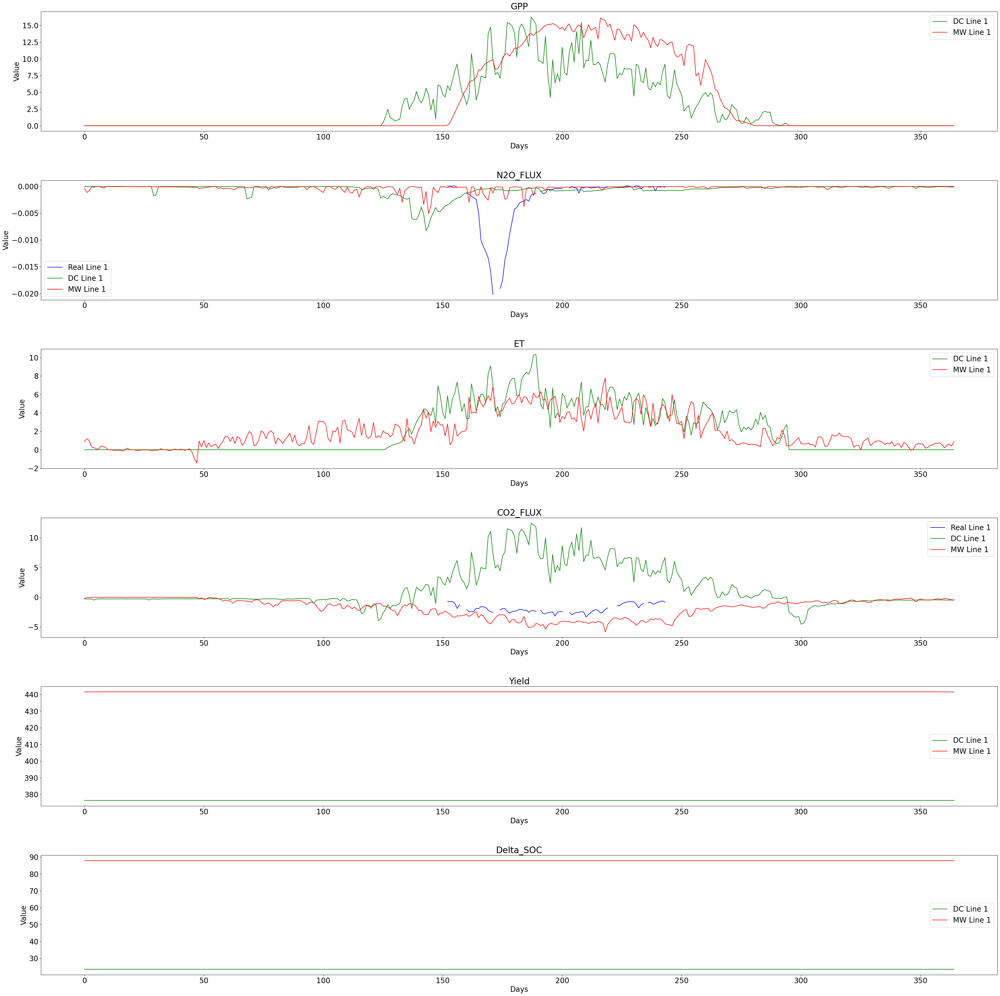

In [12]:
####2nd check plot
# Prepare real data with zero padding to fit 365 days
Y_obs_padded = np.zeros((365, 3, len(obs_Y_names)))+np.nan
Y_obs_padded[122:244, :, :] = Y_obs_all[:,:,0,:] ##### first chamber

# Extract the first place and first three full years (365 days each) from DC and MW datasets
### llc fixed, reshape has problem, please avoid. it will cause temperature seanality change
dc_data_extracted = dc_data.y_not_scaled[365*10:365*11, 10, :].numpy() ### llc fixed, fertilizer will be 0 at site 0
mw_data_extracted = mw_data.y_not_scaled[365*10:365*11, 10, :] ###also check Y_train

# Colors for each dataset
colors = ['b', 'g', 'r']  # Colors for the three different lines within each dataset

# Plotting X features that are present in both datasets
plt.rcParams.update({'font.size': 20})
fig, axes = plt.subplots(n_yfeatures, 1, figsize=(40, 40))
fig.tight_layout(pad=5.0)

x = np.arange(365)
output_names = mw_data.Y_feature_names

for i, ax in enumerate(axes.flatten()):
    for j in range(1):
        feature_name = output_names[i]
        if feature_name in obs_Y_names:
            index = obs_Y_names.index(feature_name)
            ax.plot(x, Y_obs_padded[:, j, index], color=colors[0], label=f'Real Line {j+1}')
        ax.plot(x, dc_data_extracted[:, i], color=colors[1], label=f'DC Line {j+1}')
        ax.plot(x, mw_data_extracted[:, i], color=colors[2], label=f'MW Line {j+1}')
    ax.set_title(feature_name)
    ax.set_xlabel('Days')
    ax.set_ylabel('Value')
    ax.legend()
plt.show()

## 3rd check: Check carbon, nitrogen, thermal, water cycles

### 3rd check: Check carbon

In [13]:
###3rd check: Check carbon, nitrogen, thermal, water cycles
##Carbon
mw_data = MW_Dataset1(module_name="Carbon")

3
11 11 (6570, 1980, 11)


In [14]:
dc_data = DayCent_Dataset1(module_name="Carbon")

C_S_150N_Planting
Carbon
torch.Size([7665, 2562, 11]) torch.Size([7665, 2562, 5])
torch.Size([7665, 2562, 11]) torch.Size([7665, 2562, 5])
['TMAX', 'TMIN', 'PREC', 'FERTZR_N', 'PDOY', 'PLANTT', 'TBKDS', 'TCSAND', 'TCSILT', 'TPH', 'TSOC']
torch.Size([7665, 2562, 11])
torch.Size([5840, 2562, 11]) torch.Size([730, 2562, 11]) torch.Size([1095, 2562, 11]) torch.Size([5840, 2562, 5]) torch.Size([730, 2562, 5]) torch.Size([1095, 2562, 5])


In [15]:
print(mw_data.Y_feature_names)
print(dc_data.Y_feature_names)
print(obs_Y_names)
ecosys_set = mw_data.y_not_scaled ## y_not_scaled, Y_train.numpy()
daycent_set = dc_data.y_not_scaled.numpy() ## y_not_scaled.numpy(), Y_train.numpy()
obs_set = Y_obs_all ##
print(ecosys_set.shape, daycent_set.shape,obs_set.shape) ######
n_yfeatures = len(mw_data.Y_feature_names)
for i in range(n_yfeatures):
    feature_name = mw_data.Y_feature_names[i]
    print(feature_name)
    print('Ecosys',"{:.2f}".format(np.max(ecosys_set[:,:,i])),\
          "{:.2f}".format(np.min(ecosys_set[:,:,i])),\
          "{:.2f}".format(np.mean(ecosys_set[:,:,i])))
    print('Daycent',"{:.2f}".format(np.max(daycent_set[:,:,i])),\
          "{:.2f}".format(np.min(daycent_set[:,:,i])),\
          "{:.2f}".format(np.mean(daycent_set[:,:,i])))
    if feature_name in obs_Y_names:
        index = obs_Y_names.index(feature_name)
        print('RealData',"{:.2f}".format(np.nanmax(obs_set[:,:,:,index])),\
              "{:.2f}".format(np.nanmin(obs_set[:,:,:,index])),\
              "{:.2f}".format(np.nanmean(obs_set[:,:,:,index])))

['Reco', 'GPP', 'CO2_FLUX', 'Yield', 'Delta_SOC']
['Reco', 'GPP', 'CO2_FLUX', 'Yield', 'Delta_SOC']
['N2O_FLUX', 'CO2_FLUX', 'NO3_3', 'NH4_3', 'WTR_3']
(6570, 1980, 5) (7665, 2562, 5) (122, 3, 6, 5)
Reco
Ecosys -0.01 -19.77 -2.82
Daycent -0.02 -14.40 -1.38
GPP
Ecosys 33.21 0.00 3.50
Daycent 17.63 0.00 2.21
CO2_FLUX
Ecosys 0.02 -9.30 -1.72
Daycent 14.07 -12.39 0.83
RealData -0.27 -4.92 -2.31
Yield
Ecosys 743.80 0.00 293.49
Daycent 498.23 23.08 257.17
Delta_SOC
Ecosys 502.28 -501.40 -36.68
Daycent 106.10 -17.36 37.28


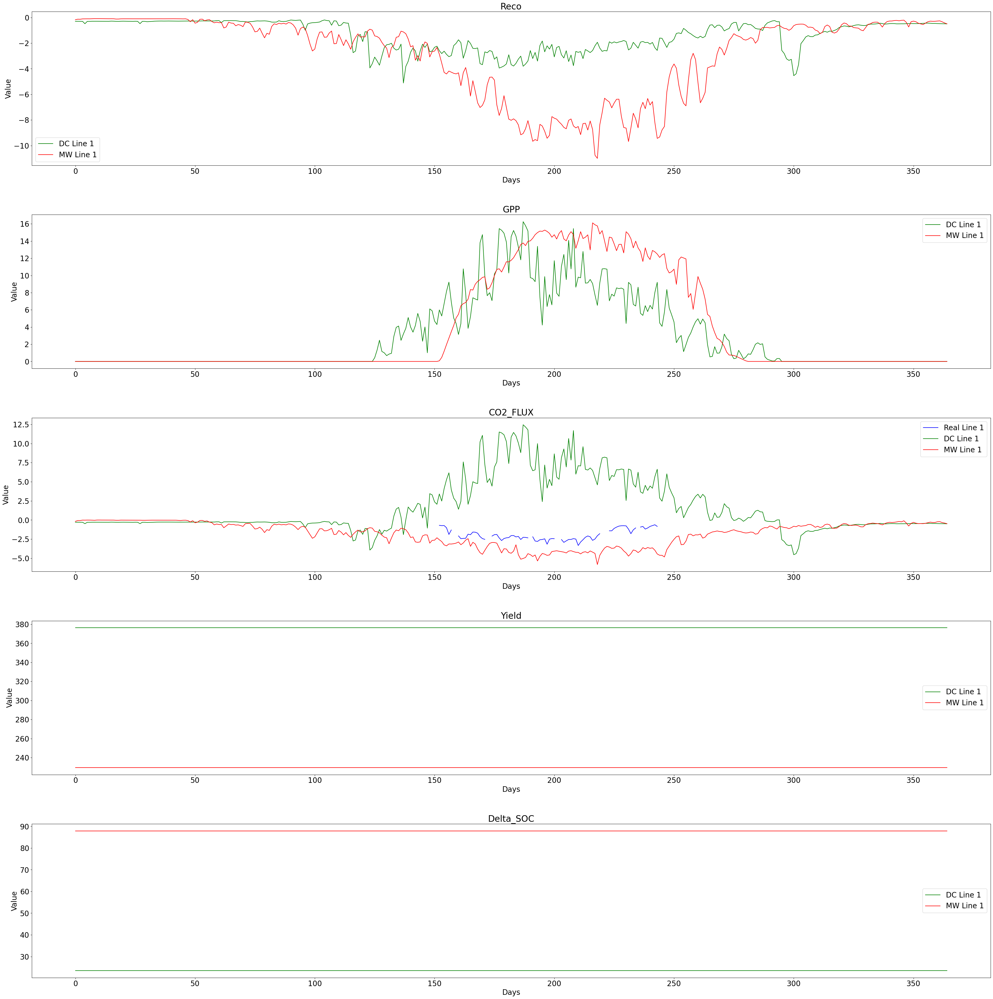

In [16]:
####3nd check plot
# Prepare real data with zero padding to fit 365 days
Y_obs_padded = np.zeros((365, 3, len(obs_Y_names)))+np.nan
Y_obs_padded[122:244, :, :] = Y_obs_all[:,:,0,:] ##### first chamber

# Extract the first place and first three full years (365 days each) from DC and MW datasets
### llc fixed, reshape has problem, please avoid. it will cause temperature seanality change
dc_data_extracted = dc_data.y_not_scaled[365*10:365*11, 10, :].numpy() ### llc fixed, fertilizer will be 0 at site 0
mw_data_extracted = mw_data.y_not_scaled[365*10:365*11, 10, :] ###also check Y_train

# Colors for each dataset
colors = ['b', 'g', 'r']  # Colors for the three different lines within each dataset

# Plotting X features that are present in both datasets
plt.rcParams.update({'font.size': 20})
fig, axes = plt.subplots(n_yfeatures, 1, figsize=(40, 40))
fig.tight_layout(pad=5.0)

x = np.arange(365)
output_names = mw_data.Y_feature_names

for i, ax in enumerate(axes.flatten()):
    for j in range(1):
        feature_name = output_names[i]
        if feature_name in obs_Y_names:
            index = obs_Y_names.index(feature_name)
            ax.plot(x, Y_obs_padded[:, j, index], color=colors[0], label=f'Real Line {j+1}')
        ax.plot(x, dc_data_extracted[:, i], color=colors[1], label=f'DC Line {j+1}')
        ax.plot(x, mw_data_extracted[:, i], color=colors[2], label=f'MW Line {j+1}')
    ax.set_title(feature_name)
    ax.set_xlabel('Days')
    ax.set_ylabel('Value')
    ax.legend()
plt.show()

### 3rd check Nitrogen

In [17]:
##3rd check Nitrogen
mw_data = MW_Dataset1(module_name="Nitrogen")

3
11 11 (6570, 1980, 11)


In [18]:
dc_data = DayCent_Dataset1(module_name="Nitrogen")

C_S_150N_Planting
Nitrogen
torch.Size([7665, 2562, 11]) torch.Size([7665, 2562, 5])
torch.Size([7665, 2562, 11]) torch.Size([7665, 2562, 5])
['TMAX', 'TMIN', 'PREC', 'FERTZR_N', 'PDOY', 'PLANTT', 'TBKDS', 'TCSAND', 'TCSILT', 'TPH', 'TSOC']
torch.Size([7665, 2562, 11])
torch.Size([5840, 2562, 11]) torch.Size([730, 2562, 11]) torch.Size([1095, 2562, 11]) torch.Size([5840, 2562, 5]) torch.Size([730, 2562, 5]) torch.Size([1095, 2562, 5])


In [19]:
print(mw_data.Y_feature_names)
print(dc_data.Y_feature_names)
print(obs_Y_names)
ecosys_set = mw_data.y_not_scaled ## y_not_scaled, Y_train.numpy()
daycent_set = dc_data.y_not_scaled.numpy() ## y_not_scaled.numpy(), Y_train.numpy()
obs_set = Y_obs_all ##
print(ecosys_set.shape, daycent_set.shape,obs_set.shape) ######
n_yfeatures = len(mw_data.Y_feature_names)
for i in range(n_yfeatures):
    feature_name = mw_data.Y_feature_names[i]
    print(feature_name)
    print('Ecosys',"{:.2f}".format(np.max(ecosys_set[:,:,i])),\
          "{:.2f}".format(np.min(ecosys_set[:,:,i])),\
          "{:.2f}".format(np.mean(ecosys_set[:,:,i])))
    print('Daycent',"{:.2f}".format(np.max(daycent_set[:,:,i])),\
          "{:.2f}".format(np.min(daycent_set[:,:,i])),\
          "{:.2f}".format(np.mean(daycent_set[:,:,i])))
    if feature_name in obs_Y_names:
        index = obs_Y_names.index(feature_name)
        print('RealData',"{:.2f}".format(np.nanmax(obs_set[:,:,:,index])),\
              "{:.2f}".format(np.nanmin(obs_set[:,:,:,index])),\
              "{:.2f}".format(np.nanmean(obs_set[:,:,:,index])))

['N2O_FLUX', 'NH4_1', 'NO3_1', 'NO3_3', 'NO3_5']
['N2O_FLUX', 'NH4_1', 'NO3_1', 'NO3_3', 'NO3_5']
['N2O_FLUX', 'CO2_FLUX', 'NO3_3', 'NH4_3', 'WTR_3']
(6570, 1980, 5) (7665, 2562, 5) (122, 3, 6, 5)
N2O_FLUX
Ecosys 0.00 -0.11 -0.00
Daycent -0.00 -0.09 -0.00
RealData 0.00 -0.07 -0.00
NH4_1
Ecosys 239.89 1.18 53.91
Daycent 127.13 -0.06 6.53
NO3_1
Ecosys 838.76 -2.08 8.36
Daycent 24.86 -0.01 1.70
NO3_3
Ecosys 194.72 0.01 6.55
Daycent 56.06 0.00 3.40
RealData 100.39 0.44 32.93
NO3_5
Ecosys 46.44 0.01 3.23
Daycent 40.64 0.00 2.41


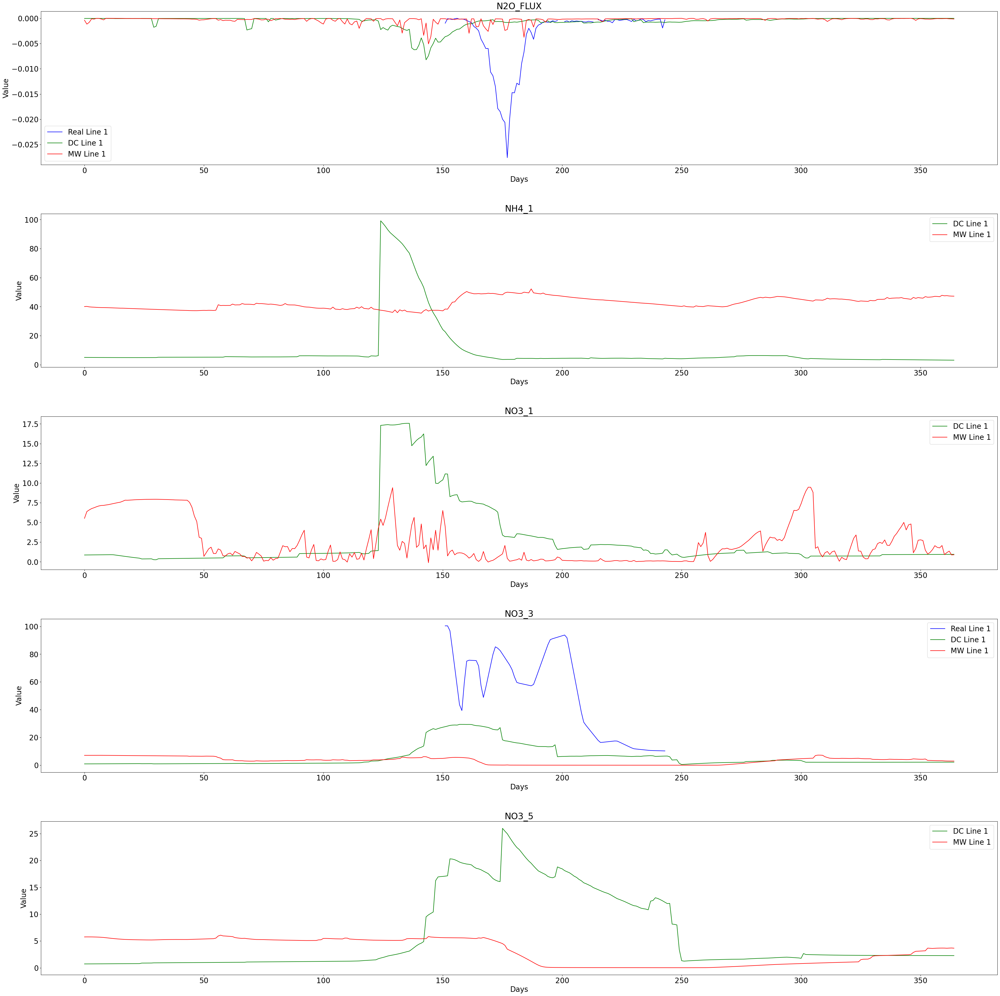

In [20]:
####3nd check plot
# Prepare real data with zero padding to fit 365 days
Y_obs_padded = np.zeros((365, 3, len(obs_Y_names)))+np.nan
Y_obs_padded[122:244, :, :] = Y_obs_all[:,:,0,:] ##### first chamber

# Extract the first place and first three full years (365 days each) from DC and MW datasets
### llc fixed, reshape has problem, please avoid. it will cause temperature seanality change
dc_data_extracted = dc_data.y_not_scaled[365*10:365*11, 10, :].numpy() ### llc fixed, fertilizer will be 0 at site 0
mw_data_extracted = mw_data.y_not_scaled[365*10:365*11, 10, :] ###also check Y_train

# Colors for each dataset
colors = ['b', 'g', 'r']  # Colors for the three different lines within each dataset

# Plotting X features that are present in both datasets
plt.rcParams.update({'font.size': 20})
fig, axes = plt.subplots(n_yfeatures, 1, figsize=(40, 40))
fig.tight_layout(pad=5.0)

x = np.arange(365)
output_names = mw_data.Y_feature_names

for i, ax in enumerate(axes.flatten()):
    for j in range(1):
        feature_name = output_names[i]
        if feature_name in obs_Y_names:
            index = obs_Y_names.index(feature_name)
            ax.plot(x, Y_obs_padded[:, j+1, index], color=colors[0], label=f'Real Line {j+1}')
        ax.plot(x, dc_data_extracted[:, i], color=colors[1], label=f'DC Line {j+1}')
        ax.plot(x, mw_data_extracted[:, i], color=colors[2], label=f'MW Line {j+1}')
    ax.set_title(feature_name)
    ax.set_xlabel('Days')
    ax.set_ylabel('Value')
    ax.legend()
plt.show()

### 3rd check Thermal

In [21]:
##3rd check Thermal
mw_data = MW_Dataset1(module_name="Thermal")

3
11 11 (6570, 1980, 11)


In [22]:
dc_data = DayCent_Dataset1(module_name="Thermal")

C_S_150N_Planting
Thermal
torch.Size([7665, 2562, 11]) torch.Size([7665, 2562, 6])
torch.Size([7665, 2562, 11]) torch.Size([7665, 2562, 6])
['TMAX', 'TMIN', 'PREC', 'FERTZR_N', 'PDOY', 'PLANTT', 'TBKDS', 'TCSAND', 'TCSILT', 'TPH', 'TSOC']
torch.Size([7665, 2562, 11])
torch.Size([5840, 2562, 11]) torch.Size([730, 2562, 11]) torch.Size([1095, 2562, 11]) torch.Size([5840, 2562, 6]) torch.Size([730, 2562, 6]) torch.Size([1095, 2562, 6])


In [23]:
print(mw_data.Y_feature_names, dc_data.Y_feature_names, obs_Y_names)
ecosys_set = mw_data.y_not_scaled ## y_not_scaled, Y_train.numpy()
daycent_set = dc_data.y_not_scaled.numpy() ## y_not_scaled.numpy(), Y_train.numpy()
obs_set = Y_obs_all ##
print(ecosys_set.shape, daycent_set.shape,obs_set.shape) ######
n_yfeatures = len(mw_data.Y_feature_names)
for i in range(n_yfeatures):
    feature_name = mw_data.Y_feature_names[i]
    print(feature_name)
    print('Ecosys',"{:.2f}".format(np.max(ecosys_set[:,:,i])),\
          "{:.2f}".format(np.min(ecosys_set[:,:,i])),\
          "{:.2f}".format(np.mean(ecosys_set[:,:,i])))
    print('Daycent',"{:.2f}".format(np.max(daycent_set[:,:,i])),\
          "{:.2f}".format(np.min(daycent_set[:,:,i])),\
          "{:.2f}".format(np.mean(daycent_set[:,:,i])))
    if feature_name in obs_Y_names:
        index = obs_Y_names.index(feature_name)
        print('RealData',"{:.2f}".format(np.nanmax(obs_set[:,:,:,index])),\
              "{:.2f}".format(np.nanmin(obs_set[:,:,:,index])),\
              "{:.2f}".format(np.nanmean(obs_set[:,:,:,index])))

['TMAX_SOIL_1', 'TMIN_SOIL_1', 'TMAX_SOIL_3', 'TMIN_SOIL_3', 'TMAX_SOIL_5', 'TMIN_SOIL_5'] ['TMAX_SOIL_1', 'TMIN_SOIL_1', 'TMAX_SOIL_3', 'TMIN_SOIL_3', 'TMAX_SOIL_5', 'TMIN_SOIL_5'] ['N2O_FLUX', 'CO2_FLUX', 'NO3_3', 'NH4_3', 'WTR_3']
(6570, 1980, 6) (7665, 2562, 6) (122, 3, 6, 5)
TMAX_SOIL_1
Ecosys 53.57 -13.98 16.29
Daycent 47.05 -13.96 16.00
TMIN_SOIL_1
Ecosys 31.53 -25.01 8.64
Daycent 29.43 -20.86 8.38
TMAX_SOIL_3
Ecosys 42.95 -13.79 13.93
Daycent 27.17 -0.18 12.85
TMIN_SOIL_3
Ecosys 32.58 -19.23 10.42
Daycent 25.13 -1.78 11.53
TMAX_SOIL_5
Ecosys 32.40 -8.86 12.00
Daycent 21.25 3.76 12.27
TMIN_SOIL_5
Ecosys 31.86 -9.17 11.65
Daycent 20.80 3.50 11.99


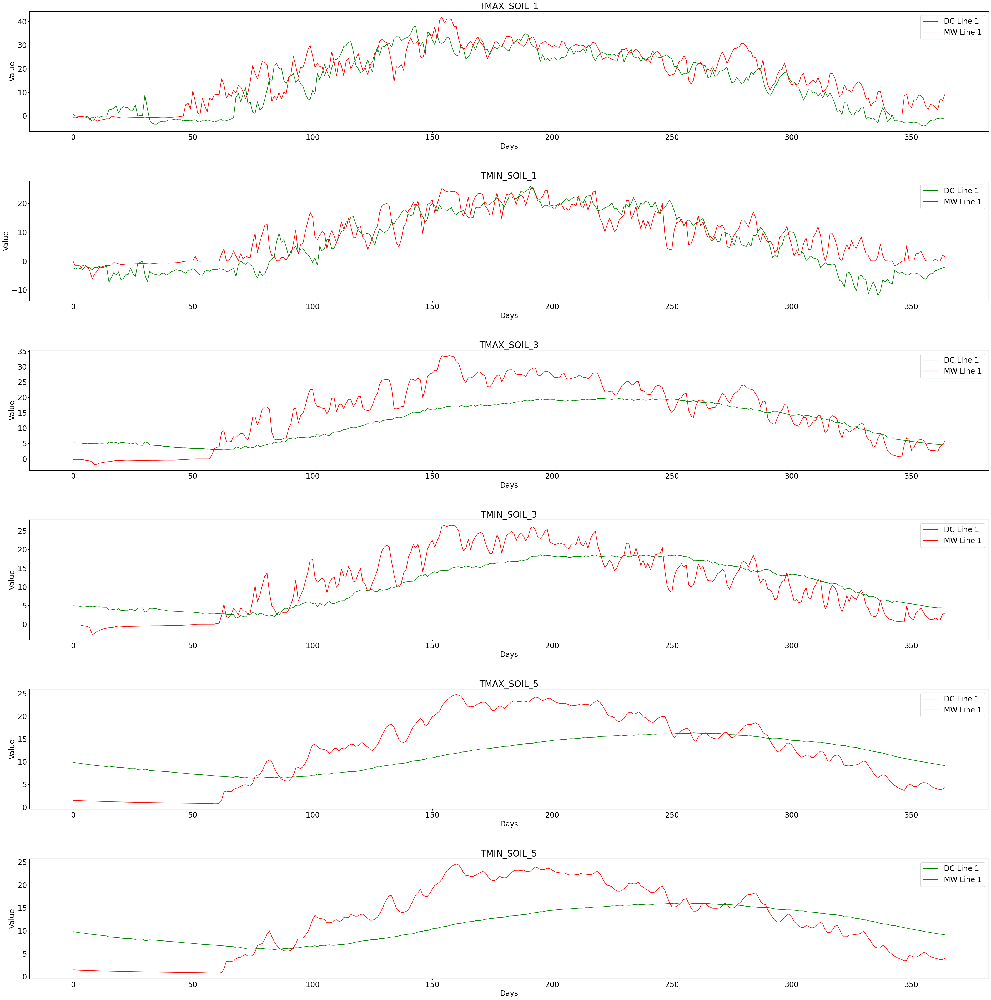

In [24]:
####3nd check plot
# Prepare real data with zero padding to fit 365 days
Y_obs_padded = np.zeros((365, 3, len(obs_Y_names)))+np.nan
Y_obs_padded[122:244, :, :] = Y_obs_all[:,:,0,:] ##### first chamber

# Extract the first place and first three full years (365 days each) from DC and MW datasets
### llc fixed, reshape has problem, please avoid. it will cause temperature seanality change
dc_data_extracted = dc_data.y_not_scaled[365*10:365*11, 10, :].numpy() ### llc fixed, fertilizer will be 0 at site 0
mw_data_extracted = mw_data.y_not_scaled[365*10:365*11, 10, :] ###also check Y_train

# Colors for each dataset
colors = ['b', 'g', 'r']  # Colors for the three different lines within each dataset

# Plotting X features that are present in both datasets
plt.rcParams.update({'font.size': 20})
fig, axes = plt.subplots(n_yfeatures, 1, figsize=(40, 40))
fig.tight_layout(pad=5.0)

x = np.arange(365)
output_names = mw_data.Y_feature_names

for i, ax in enumerate(axes.flatten()):
    for j in range(1):
        feature_name = output_names[i]
        if feature_name in obs_Y_names:
            index = obs_Y_names.index(feature_name)
            ax.plot(x, Y_obs_padded[:, j+1, index], color=colors[0], label=f'Real Line {j+1}')
        ax.plot(x, dc_data_extracted[:, i], color=colors[1], label=f'DC Line {j+1}')
        ax.plot(x, mw_data_extracted[:, i], color=colors[2], label=f'MW Line {j+1}')
    ax.set_title(feature_name)
    ax.set_xlabel('Days')
    ax.set_ylabel('Value')
    ax.legend()
plt.show()

### 3rd check Water

In [25]:
##3rd check Water
mw_data = MW_Dataset1(module_name="Water")

3
11 11 (6570, 1980, 11)


In [26]:
dc_data = DayCent_Dataset1(module_name="Water")

C_S_150N_Planting
Water
torch.Size([7665, 2562, 11]) torch.Size([7665, 2562, 4])
torch.Size([7665, 2562, 11]) torch.Size([7665, 2562, 4])
['TMAX', 'TMIN', 'PREC', 'FERTZR_N', 'PDOY', 'PLANTT', 'TBKDS', 'TCSAND', 'TCSILT', 'TPH', 'TSOC']
torch.Size([7665, 2562, 11])
torch.Size([5840, 2562, 11]) torch.Size([730, 2562, 11]) torch.Size([1095, 2562, 11]) torch.Size([5840, 2562, 4]) torch.Size([730, 2562, 4]) torch.Size([1095, 2562, 4])


In [27]:
print(mw_data.Y_feature_names, dc_data.Y_feature_names, obs_Y_names)
ecosys_set = mw_data.y_not_scaled ## y_not_scaled, Y_train.numpy()
daycent_set = dc_data.y_not_scaled.numpy() ## y_not_scaled.numpy(), Y_train.numpy()
obs_set = Y_obs_all ##
print(ecosys_set.shape, daycent_set.shape,obs_set.shape) ######
n_yfeatures = len(mw_data.Y_feature_names)
for i in range(n_yfeatures):
    feature_name = mw_data.Y_feature_names[i]
    print(feature_name)
    print('Ecosys',"{:.2f}".format(np.max(ecosys_set[:,:,i])),\
          "{:.2f}".format(np.min(ecosys_set[:,:,i])),\
          "{:.2f}".format(np.mean(ecosys_set[:,:,i])))
    print('Daycent',"{:.2f}".format(np.max(daycent_set[:,:,i])),\
          "{:.2f}".format(np.min(daycent_set[:,:,i])),\
          "{:.2f}".format(np.mean(daycent_set[:,:,i])))
    if feature_name in obs_Y_names:
        index = obs_Y_names.index(feature_name)
        print('RealData',"{:.2f}".format(np.nanmax(obs_set[:,:,:,index])),\
              "{:.2f}".format(np.nanmin(obs_set[:,:,:,index])),\
              "{:.2f}".format(np.nanmean(obs_set[:,:,:,index])))

['WTR_1', 'WTR_3', 'WTR_5', 'ET'] ['WTR_1', 'WTR_3', 'WTR_5', 'ET'] ['N2O_FLUX', 'CO2_FLUX', 'NO3_3', 'NH4_3', 'WTR_3']
(6570, 1980, 4) (7665, 2562, 4) (122, 3, 6, 5)
WTR_1
Ecosys 1.94 0.02 0.26
Daycent 0.54 0.02 0.28
WTR_3
Ecosys 0.55 0.04 0.30
Daycent 0.54 0.04 0.27
RealData 0.38 0.11 0.22
WTR_5
Ecosys 0.47 0.06 0.32
Daycent 0.54 0.04 0.28
ET
Ecosys 12.32 -3.34 1.74
Daycent 6.07 0.00 1.36


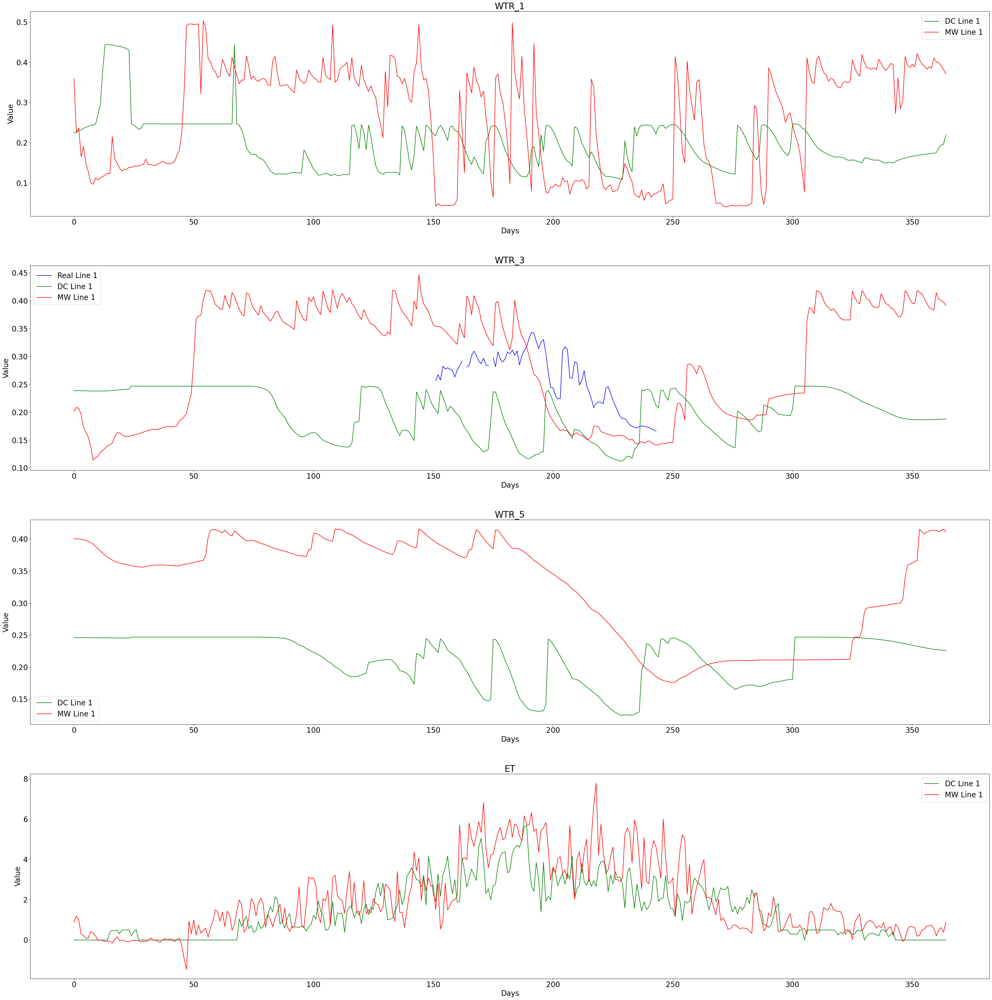

In [28]:
####3nd check plot
# Prepare real data with zero padding to fit 365 days
Y_obs_padded = np.zeros((365, 3, len(obs_Y_names)))+np.nan
Y_obs_padded[122:244, :, :] = Y_obs_all[:,:,0,:] ##### first chamber

# Extract the first place and first three full years (365 days each) from DC and MW datasets
### llc fixed, reshape has problem, please avoid. it will cause temperature seanality change
dc_data_extracted = dc_data.y_not_scaled[365*10:365*11, 10, :].numpy() ### llc fixed, fertilizer will be 0 at site 0
mw_data_extracted = mw_data.y_not_scaled[365*10:365*11, 10, :] ###also check Y_train

# Colors for each dataset
colors = ['b', 'g', 'r']  # Colors for the three different lines within each dataset

# Plotting X features that are present in both datasets
plt.rcParams.update({'font.size': 20})
fig, axes = plt.subplots(n_yfeatures, 1, figsize=(40, 40))
fig.tight_layout(pad=5.0)

x = np.arange(365)
output_names = mw_data.Y_feature_names

for i, ax in enumerate(axes.flatten()):
    for j in range(1):
        feature_name = output_names[i]
        if feature_name in obs_Y_names:
            index = obs_Y_names.index(feature_name)
            ax.plot(x, Y_obs_padded[:, j+1, index], color=colors[0], label=f'Real Line {j+1}')
        ax.plot(x, dc_data_extracted[:, i], color=colors[1], label=f'DC Line {j+1}')
        ax.plot(x, mw_data_extracted[:, i], color=colors[2], label=f'MW Line {j+1}')
    ax.set_title(feature_name)
    ax.set_xlabel('Days')
    ax.set_ylabel('Value')
    ax.legend()
plt.show()

# Scale the data

In [29]:
def Z_norm(X):
    X_mean=X.mean()
    X_std=np.std(np.array(X))
    return (X-X_mean)/X_std, X_mean, X_std

def Z_norm_with_scaler(X, X_mean, X_std):
    return (X-X_mean)/X_std

mw_data = MW_Dataset1(module_name="Combined")
dc_data = DayCent_Dataset1(module_name="Combined")

X_mw = mw_data.x_not_scaled
Y_mw = mw_data.y_not_scaled

X_dc = dc_data.x_not_scaled[:, :1980, :]
Y_dc = dc_data.y_not_scaled[:, :1980, :]

# Combine the mw and dc data
X_combined = np.concatenate((X_mw, X_dc), axis=0)
Y_combined = np.concatenate((Y_mw, Y_dc), axis=0)

# Initialize scalers
Xscaler = np.zeros((X_combined.shape[2], 2))
Yscaler = np.zeros((Y_combined.shape[2], 2))

# Apply Z-normalization to the combined X data
for i in range(X_combined.shape[2]):
    X_combined[:, :, i], Xscaler[i, 0], Xscaler[i, 1] = Z_norm(X_combined[:, :, i])

# Apply Z-normalization to the combined Y data
for i in range(Y_combined.shape[2]):
    Y_combined[:, :, i], Yscaler[i, 0], Yscaler[i, 1] = Z_norm(Y_combined[:, :, i])

# Split the combined
X_mw_scaled = X_combined[:X_mw.shape[0], :, :]
X_dc_scaled = X_combined[X_mw.shape[0]:, :, :]

Y_mw_scaled = Y_combined[:Y_mw.shape[0], :, :]
Y_dc_scaled = Y_combined[Y_mw.shape[0]:, :, :]

X_list = []
Y_list = []
for i in range(6):
    X_obs_padded = np.zeros((365, 3, 11))
    X_obs_padded[122:244, :, :] = X_obs_all[:,:,i,:] ##### i th chamber

    Y_obs_padded = np.zeros((365, 3, len(obs_Y_names)))+np.nan
    Y_obs_padded[122:244, :, :] = Y_obs_all[:,:,i,:] ##### i th chamber

    # Input features for mw and dc: ['TMAX','TMIN','PREC', 'FERTZR_N', 'PDOY','PLANTT', 'TBKDS', 'TCSAND', 'TCSILT', 'TPH','TSOC']
    # Output features for mw and dc:  out_names=["GPP", "N2O_FLUX", "ET", "CO2_FLUX", "Yield", "Delta_SOC"]


    # Apply Z-normalization to the real X data
    for i in range(X_obs_padded.shape[2]):
        X_obs_padded[:, :, i]= Z_norm_with_scaler(X_obs_padded[:, :, i], Xscaler[i, 0], Xscaler[i, 1])

    # Apply Z-normalization to the real Y data, N2O_FLUX
    Y_obs_padded[:, :, 0]= Z_norm_with_scaler(Y_obs_padded[:, :, 0], Yscaler[1, 0], Yscaler[1, 1])
    # Apply Z-normalization to the real Y data, CO2_FLUX
    Y_obs_padded[:, :, 1]= Z_norm_with_scaler(Y_obs_padded[:, :, 1], Yscaler[3, 0], Yscaler[3, 1])
    
    X_list.append(X_obs_padded)
    Y_list.append(Y_obs_padded)

3
11 11 (6570, 1980, 11)
C_S_150N_Planting
Combined
torch.Size([7665, 2562, 11]) torch.Size([7665, 2562, 6])
torch.Size([7665, 2562, 11]) torch.Size([7665, 2562, 6])
['TMAX', 'TMIN', 'PREC', 'FERTZR_N', 'PDOY', 'PLANTT', 'TBKDS', 'TCSAND', 'TCSILT', 'TPH', 'TSOC']
torch.Size([7665, 2562, 11])
torch.Size([5840, 2562, 11]) torch.Size([730, 2562, 11]) torch.Size([1095, 2562, 11]) torch.Size([5840, 2562, 6]) torch.Size([730, 2562, 6]) torch.Size([1095, 2562, 6])


In [30]:
# Define file paths
X_dc_scaled_path = 'data_files/t0_dc/X_dc_scaled.npy'
Y_dc_scaled_path = 'data_files/t0_dc/Y_dc_scaled_Combined.npy'
X_mw_scaled_path = 'data_files/t0_mw/X_mw_scaled.npy'
Y_mw_scaled_path = 'data_files/t0_mw/Y_mw_scaled_Combined.npy'
X_scaler_path = 'data_files/t0_scalers/X_scaler.npy'
Y_scaler_path = 'data_files/t0_scalers/Y_scaler_Combined.npy'

# Save the scaled data
np.save(X_dc_scaled_path, X_dc_scaled)
np.save(Y_dc_scaled_path, Y_dc_scaled)
np.save(X_mw_scaled_path, X_mw_scaled)
np.save(Y_mw_scaled_path, Y_mw_scaled)
np.save(X_scaler_path, Xscaler)
np.save(Y_scaler_path, Yscaler)

for i in range(6):
    np.save(f'data_files/t1_n2o/X_real_scaled_{i}.npy', X_list[i])
    np.save(f'data_files/t1_n2o/Y_real_scaled_Combined_{i}.npy', Y_list[i])

print(Y_dc_scaled.shape)
print(Y_mw_scaled.shape)

(7665, 1980, 6)
(6570, 1980, 6)


## Check scaled data

In [31]:
#####1st check: The range of every input features original values
print(mw_data.X_feature_names, dc_data.X_feature_names)
ecosys_set = X_mw_scaled 
daycent_set = X_dc_scaled ## x_not_scaled.numpy(), X_train.numpy()
print(ecosys_set.shape,daycent_set.shape) ######
obs_set = X_obs_padded ##
n_xfeatures = len(mw_data.X_feature_names)
for i in range(n_xfeatures):
    print(mw_data.X_feature_names[i])
    print('Ecosys',"{:.2f}".format(np.max(ecosys_set[:,:,i])),\
          "{:.2f}".format(np.min(ecosys_set[:,:,i])),\
          "{:.2f}".format(np.mean(ecosys_set[:,:,i])))
    print('Daycent',"{:.2f}".format(np.max(daycent_set[:,:,i])),\
          "{:.2f}".format(np.min(daycent_set[:,:,i])),\
          "{:.2f}".format(np.mean(daycent_set[:,:,i])))
    print('RealData',"{:.2f}".format(np.max(obs_set[:,:,i])),\
          "{:.2f}".format(np.min(obs_set[:,:,i])),\
          "{:.2f}".format(np.mean(obs_set[:,:,i])))

['TMAX_AIR', 'TMIN_AIR', 'PRECN', 'FERTZR_N', 'PDOY', 'PLANTT', 'TBKDS', 'TCSAND', 'TCSILT', 'TPH', 'TSOC'] ['TMAX', 'TMIN', 'PREC', 'FERTZR_N', 'PDOY', 'PLANTT', 'TBKDS', 'TCSAND', 'TCSILT', 'TPH', 'TSOC']
(6570, 1980, 11) (7665, 1980, 11)
TMAX_AIR
Ecosys 2.54 -3.28 0.04
Daycent 2.58 -3.58 -0.04
RealData 2.02 -1.59 -0.63
TMIN_AIR
Ecosys 2.40 -3.57 0.12
Daycent 2.25 -4.01 -0.10
RealData 1.58 -0.55 -0.20
PRECN
Ecosys 20.74 -0.38 -0.00
Daycent 33.08 -0.38 0.00
RealData 4.92 -0.38 -0.23
FERTZR_N
Ecosys 45.97 -0.04 0.00
Daycent 22.95 -0.04 -0.00
RealData 30.61 -0.04 0.03
PDOY
Ecosys 19.08 -0.05 -0.00
Daycent 19.08 -0.05 -0.00
RealData 19.08 -0.05 -0.00
PLANTT
Ecosys 0.88 -1.14 0.09
Daycent 0.88 -1.14 -0.08
RealData 0.88 -1.14 -0.46
TBKDS
Ecosys 1.41 -0.27 0.55
Daycent 2.80 -6.07 -0.47
RealData 0.93 -8.76 -5.52
TCSAND
Ecosys 4.23 -0.86 0.17
Daycent 4.72 -1.11 -0.14
RealData -1.01 -1.19 -1.13
TCSILT
Ecosys 1.42 -3.29 0.02
Daycent 1.93 -3.72 -0.02
RealData -0.16 -4.01 -2.72
TPH
Ecosys 1.25 -1

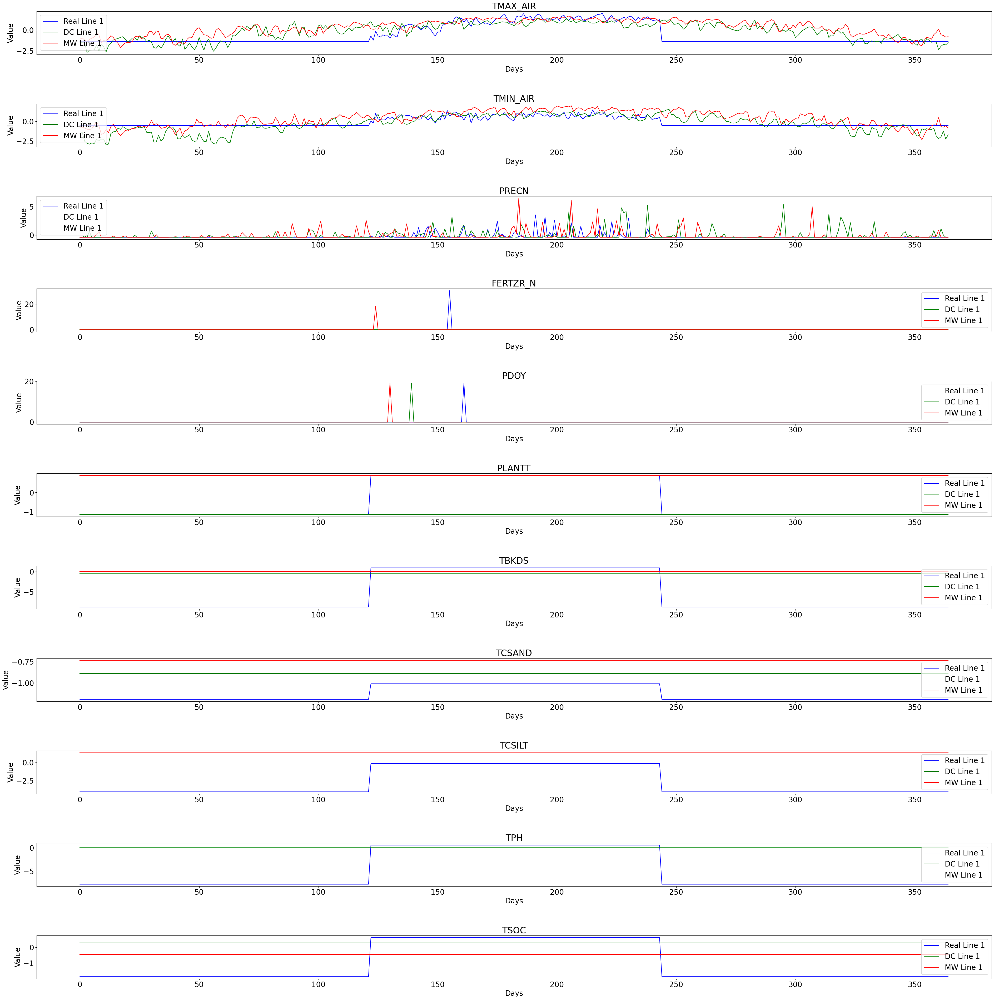

In [32]:
####1st check plot

# Extract the first place and first three full years (365 days each) from DC and MW datasets
### llc fixed, reshape has problem, please avoid. it will cause temperature seanality change
#dc_data_extracted = dc_data.x_not_scaled[:365*3, 5, :].reshape(365, 3, -1).numpy() 
#mw_data_extracted = mw_data.x_not_scaled[:365*3, 5, :].reshape(365, 3, -1)
dc_data_extracted = X_dc_scaled[365*15:365*16, 5, :] ### llc fixed, fertilizer will be 0 at site 0
mw_data_extracted = X_mw_scaled[365*15:365*16, 5, :]

# Colors for each dataset
colors = ['b', 'g', 'r']  # Colors for the three different lines within each dataset

# Plotting X features that are present in both datasets
plt.rcParams.update({'font.size': 20})
fig, axes = plt.subplots(11, 1, figsize=(40, 40))
fig.tight_layout(pad=5.0)

x = np.arange(365)

for i, ax in enumerate(axes.flatten()):
    for j in range(1):
        ax.plot(x, X_obs_padded[:, j, i], color=colors[0], label=f'Real Line {j+1}')
        ax.plot(x, dc_data_extracted[:, i], color=colors[1], label=f'DC Line {j+1}')
        ax.plot(x, mw_data_extracted[:, i], color=colors[2], label=f'MW Line {j+1}')
    ax.set_title(f_names[i])
    ax.set_xlabel('Days')
    ax.set_ylabel('Value')
    ax.legend()
plt.show()

In [33]:
#####1st check: The range of every input features original values
print(mw_data.X_feature_names, dc_data.X_feature_names)
ecosys_set = X_mw_scaled 
daycent_set = X_dc_scaled ## x_not_scaled.numpy(), X_train.numpy()
print(ecosys_set.shape,daycent_set.shape) ######
obs_set = X_obs_padded ##
n_xfeatures = len(mw_data.X_feature_names)
for i in range(n_xfeatures):
    print(mw_data.X_feature_names[i])
    print('Ecosys',"{:.2f}".format(np.max(ecosys_set[:,:,i])),\
          "{:.2f}".format(np.min(ecosys_set[:,:,i])),\
          "{:.2f}".format(np.mean(ecosys_set[:,:,i])))
    print('Daycent',"{:.2f}".format(np.max(daycent_set[:,:,i])),\
          "{:.2f}".format(np.min(daycent_set[:,:,i])),\
          "{:.2f}".format(np.mean(daycent_set[:,:,i])))
    print('RealData',"{:.2f}".format(np.max(obs_set[:,:,i])),\
          "{:.2f}".format(np.min(obs_set[:,:,i])),\
          "{:.2f}".format(np.mean(obs_set[:,:,i])))

['TMAX_AIR', 'TMIN_AIR', 'PRECN', 'FERTZR_N', 'PDOY', 'PLANTT', 'TBKDS', 'TCSAND', 'TCSILT', 'TPH', 'TSOC'] ['TMAX', 'TMIN', 'PREC', 'FERTZR_N', 'PDOY', 'PLANTT', 'TBKDS', 'TCSAND', 'TCSILT', 'TPH', 'TSOC']
(6570, 1980, 11) (7665, 1980, 11)
TMAX_AIR
Ecosys 2.54 -3.28 0.04
Daycent 2.58 -3.58 -0.04
RealData 2.02 -1.59 -0.63
TMIN_AIR
Ecosys 2.40 -3.57 0.12
Daycent 2.25 -4.01 -0.10
RealData 1.58 -0.55 -0.20
PRECN
Ecosys 20.74 -0.38 -0.00
Daycent 33.08 -0.38 0.00
RealData 4.92 -0.38 -0.23
FERTZR_N
Ecosys 45.97 -0.04 0.00
Daycent 22.95 -0.04 -0.00
RealData 30.61 -0.04 0.03
PDOY
Ecosys 19.08 -0.05 -0.00
Daycent 19.08 -0.05 -0.00
RealData 19.08 -0.05 -0.00
PLANTT
Ecosys 0.88 -1.14 0.09
Daycent 0.88 -1.14 -0.08
RealData 0.88 -1.14 -0.46
TBKDS
Ecosys 1.41 -0.27 0.55
Daycent 2.80 -6.07 -0.47
RealData 0.93 -8.76 -5.52
TCSAND
Ecosys 4.23 -0.86 0.17
Daycent 4.72 -1.11 -0.14
RealData -1.01 -1.19 -1.13
TCSILT
Ecosys 1.42 -3.29 0.02
Daycent 1.93 -3.72 -0.02
RealData -0.16 -4.01 -2.72
TPH
Ecosys 1.25 -1

In [34]:
#####2st check: The range of every output features original values, in different model modes
##combined
print(mw_data.Y_feature_names, dc_data.Y_feature_names, obs_Y_names)
ecosys_set = Y_mw_scaled ## y_not_scaled, Y_train.numpy()
daycent_set = Y_dc_scaled ## y_not_scaled.numpy(), Y_train.numpy()
obs_set = Y_obs_padded ##
print(ecosys_set.shape, daycent_set.shape,obs_set.shape) ######
n_yfeatures = len(mw_data.Y_feature_names)
for i in range(n_yfeatures):
    feature_name = mw_data.Y_feature_names[i]
    print(feature_name)
    print('Ecosys',"{:.2f}".format(np.max(ecosys_set[:,:,i])),\
          "{:.2f}".format(np.min(ecosys_set[:,:,i])),\
          "{:.2f}".format(np.mean(ecosys_set[:,:,i])))
    print('Daycent',"{:.2f}".format(np.max(daycent_set[:,:,i])),\
          "{:.2f}".format(np.min(daycent_set[:,:,i])),\
          "{:.2f}".format(np.mean(daycent_set[:,:,i])))
    if feature_name in obs_Y_names:
        index = obs_Y_names.index(feature_name)
        print('RealData',"{:.2f}".format(np.nanmax(obs_set[:,:,index])),\
              "{:.2f}".format(np.nanmin(obs_set[:,:,index])),\
              "{:.2f}".format(np.nanmean(obs_set[:,:,index])))

['GPP', 'N2O_FLUX', 'ET', 'CO2_FLUX', 'Yield', 'Delta_SOC'] ['GPP', 'N2O_FLUX', 'ET', 'CO2_FLUX', 'Yield', 'Delta_SOC'] ['N2O_FLUX', 'CO2_FLUX', 'NO3_3', 'NH4_3', 'WTR_3']
(6570, 1980, 6) (7665, 1980, 6) (365, 3, 5)
GPP
Ecosys 6.24 -0.57 0.14
Daycent 3.04 -0.57 -0.12
N2O_FLUX
Ecosys 0.41 -61.99 0.03
Daycent 0.30 -44.31 -0.03
RealData 0.45 -13.04 -1.64
ET
Ecosys 4.99 -2.41 -0.01
Daycent 4.43 -0.83 0.01
CO2_FLUX
Ecosys 0.14 -3.33 -0.51
Daycent 5.37 -4.48 0.44
RealData -0.11 -1.36 -0.69
Yield
Ecosys 3.38 -2.03 0.17
Daycent 1.94 -2.21 -0.14
Delta_SOC
Ecosys 6.65 -6.71 -0.53
Daycent 1.35 -0.18 0.45


N2O_FLUX 0
CO2_FLUX 1


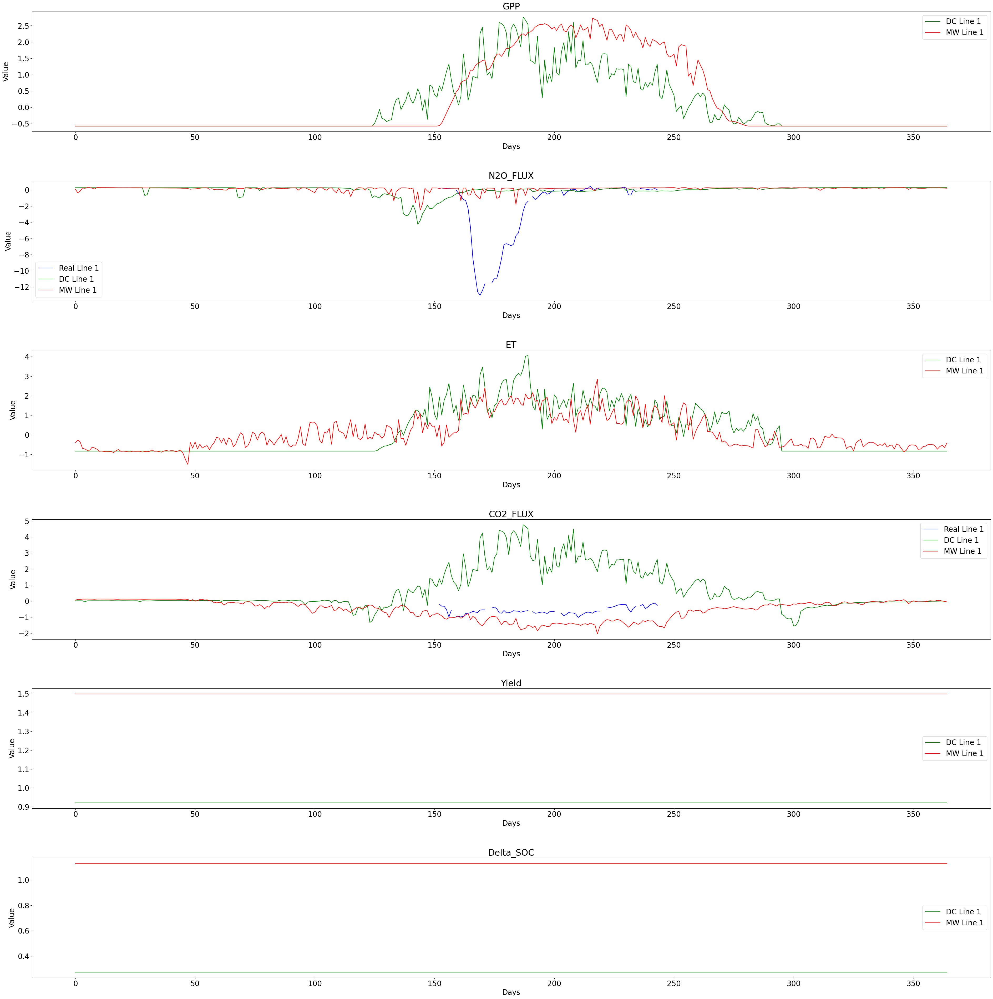

In [35]:
####2nd check plot

# Extract the first place and first three full years (365 days each) from DC and MW datasets
### llc fixed, reshape has problem, please avoid. it will cause temperature seanality change
dc_data_extracted = Y_dc_scaled[365*10:365*11, 10, :] ### llc fixed, fertilizer will be 0 at site 0
mw_data_extracted = Y_mw_scaled[365*10:365*11, 10, :] ###also check Y_train

# Colors for each dataset
colors = ['b', 'g', 'r']  # Colors for the three different lines within each dataset

# Plotting X features that are present in both datasets
plt.rcParams.update({'font.size': 20})
fig, axes = plt.subplots(n_yfeatures, 1, figsize=(40, 40))
fig.tight_layout(pad=5.0)

x = np.arange(365)
output_names = mw_data.Y_feature_names

for i, ax in enumerate(axes.flatten()):
    for j in range(1):
        feature_name = output_names[i]
        if feature_name in obs_Y_names:
            index = obs_Y_names.index(feature_name)
            print(feature_name, index)
            ax.plot(x, Y_obs_padded[:, j, index], color=colors[0], label=f'Real Line {j+1}')
        ax.plot(x, dc_data_extracted[:, i], color=colors[1], label=f'DC Line {j+1}')
        ax.plot(x, mw_data_extracted[:, i], color=colors[2], label=f'MW Line {j+1}')
    ax.set_title(feature_name)
    ax.set_xlabel('Days')
    ax.set_ylabel('Value')
    ax.legend()
plt.show()

## Scale and save other modules

In [36]:
module_name = "Water"
mw_data = MW_Dataset1(module_name=module_name)
dc_data = DayCent_Dataset1(module_name=module_name)

Y_mw = mw_data.y_not_scaled

Y_dc = dc_data.y_not_scaled[:, :1980, :]

Y_combined = np.concatenate((Y_mw, Y_dc), axis=0)

Yscaler = np.zeros((Y_combined.shape[2], 2))

# Apply Z-normalization to the combined Y data
for i in range(Y_combined.shape[2]):
    Y_combined[:, :, i], Yscaler[i, 0], Yscaler[i, 1] = Z_norm(Y_combined[:, :, i])

Y_mw_scaled = Y_combined[:Y_mw.shape[0], :, :]
Y_dc_scaled = Y_combined[Y_mw.shape[0]:, :, :]

# Define file paths
Y_dc_scaled_path = f'data_files/t0_dc/Y_dc_scaled_{module_name}.npy'
Y_mw_scaled_path = f'data_files/t0_mw/Y_mw_scaled_{module_name}.npy'
Y_scaler_path = f'data_files/t0_scalers/Y_scaler_{module_name}.npy'
np.save(Y_scaler_path, Yscaler)

# Save the scaled data
np.save(Y_dc_scaled_path, Y_dc_scaled)
np.save(Y_mw_scaled_path, Y_mw_scaled)


3
11 11 (6570, 1980, 11)
C_S_150N_Planting
Water
torch.Size([7665, 2562, 11]) torch.Size([7665, 2562, 4])
torch.Size([7665, 2562, 11]) torch.Size([7665, 2562, 4])
['TMAX', 'TMIN', 'PREC', 'FERTZR_N', 'PDOY', 'PLANTT', 'TBKDS', 'TCSAND', 'TCSILT', 'TPH', 'TSOC']
torch.Size([7665, 2562, 11])
torch.Size([5840, 2562, 11]) torch.Size([730, 2562, 11]) torch.Size([1095, 2562, 11]) torch.Size([5840, 2562, 4]) torch.Size([730, 2562, 4]) torch.Size([1095, 2562, 4])


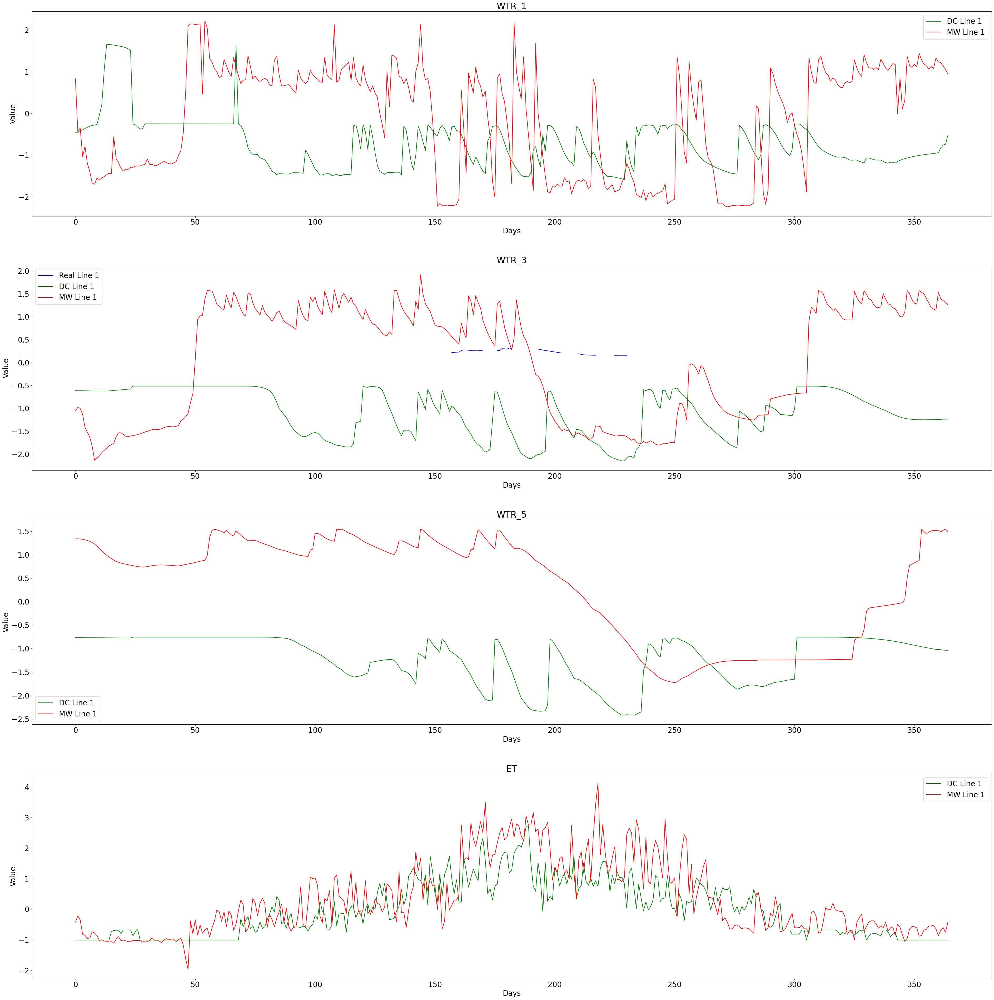

In [37]:
####2nd check plot

# Extract the first place and first three full years (365 days each) from DC and MW datasets
### llc fixed, reshape has problem, please avoid. it will cause temperature seanality change
dc_data_extracted = Y_dc_scaled[365*10:365*11, 10, :] ### llc fixed, fertilizer will be 0 at site 0
mw_data_extracted = Y_mw_scaled[365*10:365*11, 10, :] ###also check Y_train

# Colors for each dataset
colors = ['b', 'g', 'r']  # Colors for the three different lines within each dataset

# Plotting X features that are present in both datasets
plt.rcParams.update({'font.size': 20})
fig, axes = plt.subplots(len(mw_data.Y_feature_names), 1, figsize=(40, 40))
fig.tight_layout(pad=5.0)

x = np.arange(365)
output_names = mw_data.Y_feature_names

for i, ax in enumerate(axes.flatten()):
    for j in range(1):
        feature_name = output_names[i]
        if feature_name in obs_Y_names:
            index = obs_Y_names.index(feature_name)
            ax.plot(x, Y_obs_padded[:, j, index], color=colors[0], label=f'Real Line {j+1}')
        ax.plot(x, dc_data_extracted[:, i], color=colors[1], label=f'DC Line {j+1}')
        ax.plot(x, mw_data_extracted[:, i], color=colors[2], label=f'MW Line {j+1}')
    ax.set_title(feature_name)
    ax.set_xlabel('Days')
    ax.set_ylabel('Value')
    ax.legend()
plt.show()

3
11 11 (6570, 1980, 11)
C_S_150N_Planting
Thermal
torch.Size([7665, 2562, 11]) torch.Size([7665, 2562, 6])
torch.Size([7665, 2562, 11]) torch.Size([7665, 2562, 6])
['TMAX', 'TMIN', 'PREC', 'FERTZR_N', 'PDOY', 'PLANTT', 'TBKDS', 'TCSAND', 'TCSILT', 'TPH', 'TSOC']
torch.Size([7665, 2562, 11])
torch.Size([5840, 2562, 11]) torch.Size([730, 2562, 11]) torch.Size([1095, 2562, 11]) torch.Size([5840, 2562, 6]) torch.Size([730, 2562, 6]) torch.Size([1095, 2562, 6])


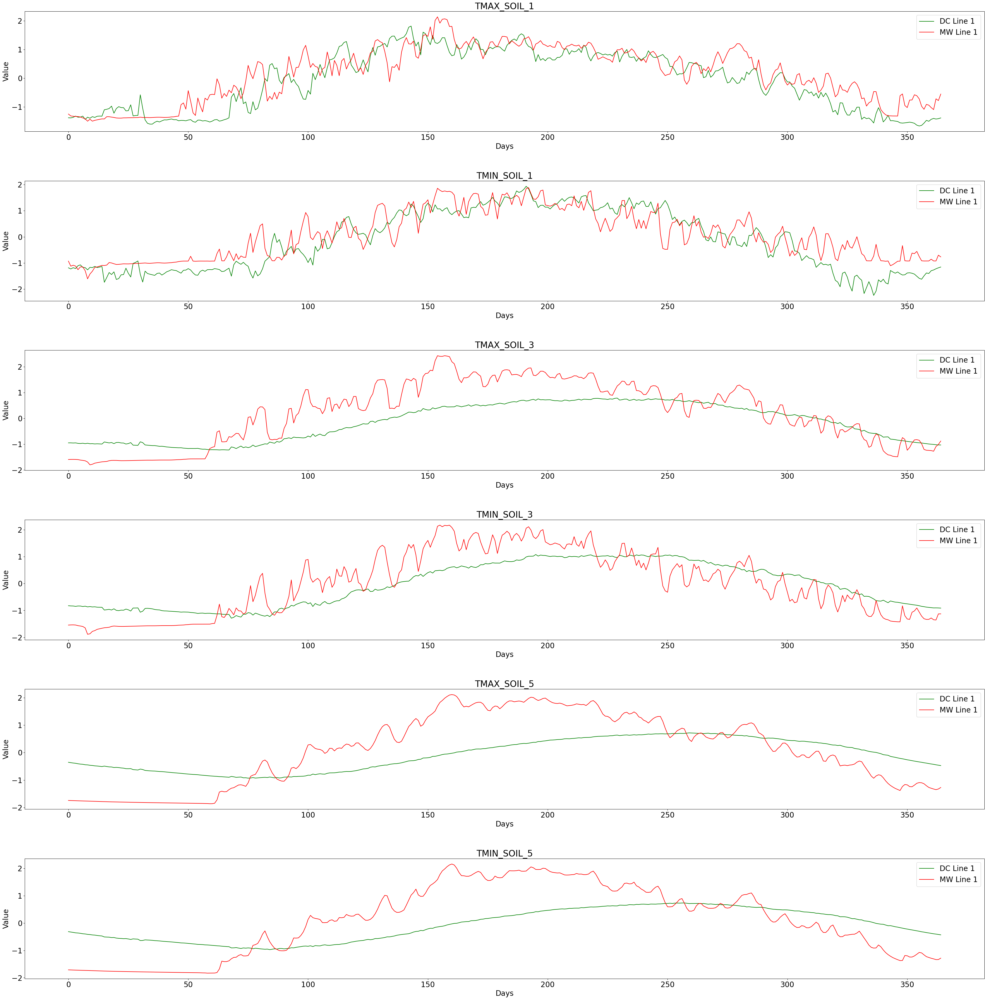

In [38]:
module_name = "Thermal"
mw_data = MW_Dataset1(module_name=module_name)
dc_data = DayCent_Dataset1(module_name=module_name)

Y_mw = mw_data.y_not_scaled

Y_dc = dc_data.y_not_scaled[:, :1980, :]

Y_combined = np.concatenate((Y_mw, Y_dc), axis=0)

Yscaler = np.zeros((Y_combined.shape[2], 2))

# Apply Z-normalization to the combined Y data
for i in range(Y_combined.shape[2]):
    Y_combined[:, :, i], Yscaler[i, 0], Yscaler[i, 1] = Z_norm(Y_combined[:, :, i])

Y_mw_scaled = Y_combined[:Y_mw.shape[0], :, :]
Y_dc_scaled = Y_combined[Y_mw.shape[0]:, :, :]

# Define file paths
Y_dc_scaled_path = f'data_files/t0_dc/Y_dc_scaled_{module_name}.npy'
Y_mw_scaled_path = f'data_files/t0_mw/Y_mw_scaled_{module_name}.npy'
Y_scaler_path = f'data_files/t0_scalers/Y_scaler_{module_name}.npy'
np.save(Y_scaler_path, Yscaler)
# Save the scaled data
np.save(Y_dc_scaled_path, Y_dc_scaled)
np.save(Y_mw_scaled_path, Y_mw_scaled)

####2nd check plot

# Extract the first place and first three full years (365 days each) from DC and MW datasets
### llc fixed, reshape has problem, please avoid. it will cause temperature seanality change
dc_data_extracted = Y_dc_scaled[365*10:365*11, 10, :] ### llc fixed, fertilizer will be 0 at site 0
mw_data_extracted = Y_mw_scaled[365*10:365*11, 10, :] ###also check Y_train

# Colors for each dataset
colors = ['b', 'g', 'r']  # Colors for the three different lines within each dataset

# Plotting X features that are present in both datasets
plt.rcParams.update({'font.size': 20})
fig, axes = plt.subplots(len(mw_data.Y_feature_names), 1, figsize=(40, 40))
fig.tight_layout(pad=5.0)

x = np.arange(365)
output_names = mw_data.Y_feature_names

for i, ax in enumerate(axes.flatten()):
    for j in range(1):
        feature_name = output_names[i]
        if feature_name in obs_Y_names:
            index = obs_Y_names.index(feature_name)
            ax.plot(x, Y_obs_padded[:, j, index], color=colors[0], label=f'Real Line {j+1}')
        ax.plot(x, dc_data_extracted[:, i], color=colors[1], label=f'DC Line {j+1}')
        ax.plot(x, mw_data_extracted[:, i], color=colors[2], label=f'MW Line {j+1}')
    ax.set_title(feature_name)
    ax.set_xlabel('Days')
    ax.set_ylabel('Value')
    ax.legend()
plt.show()

3
11 11 (6570, 1980, 11)
C_S_150N_Planting
Carbon
torch.Size([7665, 2562, 11]) torch.Size([7665, 2562, 5])
torch.Size([7665, 2562, 11]) torch.Size([7665, 2562, 5])
['TMAX', 'TMIN', 'PREC', 'FERTZR_N', 'PDOY', 'PLANTT', 'TBKDS', 'TCSAND', 'TCSILT', 'TPH', 'TSOC']
torch.Size([7665, 2562, 11])
torch.Size([5840, 2562, 11]) torch.Size([730, 2562, 11]) torch.Size([1095, 2562, 11]) torch.Size([5840, 2562, 5]) torch.Size([730, 2562, 5]) torch.Size([1095, 2562, 5])


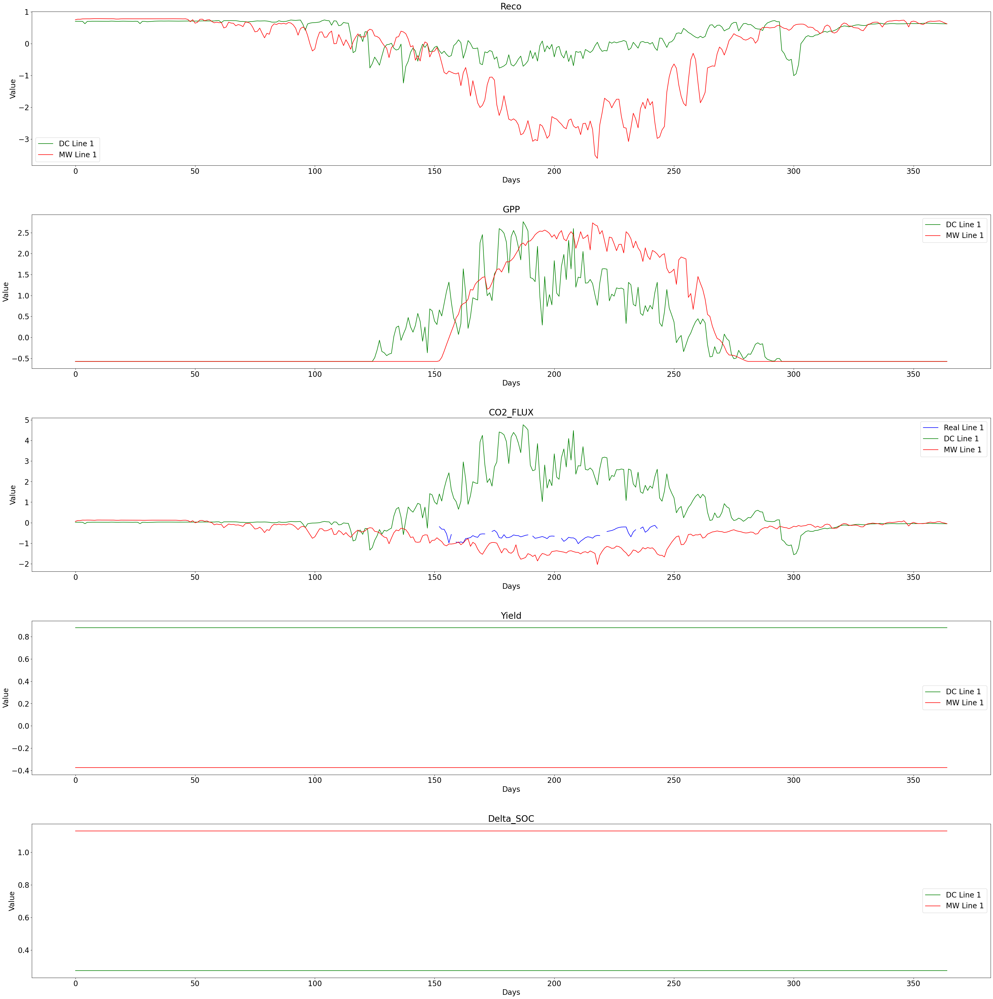

In [39]:
module_name = "Carbon"
mw_data = MW_Dataset1(module_name=module_name)
dc_data = DayCent_Dataset1(module_name=module_name)

Y_mw = mw_data.y_not_scaled

Y_dc = dc_data.y_not_scaled[:, :1980, :]

Y_combined = np.concatenate((Y_mw, Y_dc), axis=0)

Yscaler = np.zeros((Y_combined.shape[2], 2))

# Apply Z-normalization to the combined Y data
for i in range(Y_combined.shape[2]):
    Y_combined[:, :, i], Yscaler[i, 0], Yscaler[i, 1] = Z_norm(Y_combined[:, :, i])

Y_mw_scaled = Y_combined[:Y_mw.shape[0], :, :]
Y_dc_scaled = Y_combined[Y_mw.shape[0]:, :, :]

# Define file paths
Y_dc_scaled_path = f'data_files/t0_dc/Y_dc_scaled_{module_name}.npy'
Y_mw_scaled_path = f'data_files/t0_mw/Y_mw_scaled_{module_name}.npy'
Y_scaler_path = f'data_files/t0_scalers/Y_scaler_{module_name}.npy'
np.save(Y_scaler_path, Yscaler)
# Save the scaled data
np.save(Y_dc_scaled_path, Y_dc_scaled)
np.save(Y_mw_scaled_path, Y_mw_scaled)

####2nd check plot

# Extract the first place and first three full years (365 days each) from DC and MW datasets
### llc fixed, reshape has problem, please avoid. it will cause temperature seanality change
dc_data_extracted = Y_dc_scaled[365*10:365*11, 10, :] ### llc fixed, fertilizer will be 0 at site 0
mw_data_extracted = Y_mw_scaled[365*10:365*11, 10, :] ###also check Y_train

# Colors for each dataset
colors = ['b', 'g', 'r']  # Colors for the three different lines within each dataset

# Plotting X features that are present in both datasets
plt.rcParams.update({'font.size': 20})
fig, axes = plt.subplots(len(mw_data.Y_feature_names), 1, figsize=(40, 40))
fig.tight_layout(pad=5.0)

x = np.arange(365)
output_names = mw_data.Y_feature_names

for i, ax in enumerate(axes.flatten()):
    for j in range(1):
        feature_name = output_names[i]
        if feature_name in obs_Y_names:
            index = obs_Y_names.index(feature_name)
            ax.plot(x, Y_obs_padded[:, j, index], color=colors[0], label=f'Real Line {j+1}')
        ax.plot(x, dc_data_extracted[:, i], color=colors[1], label=f'DC Line {j+1}')
        ax.plot(x, mw_data_extracted[:, i], color=colors[2], label=f'MW Line {j+1}')
    ax.set_title(feature_name)
    ax.set_xlabel('Days')
    ax.set_ylabel('Value')
    ax.legend()
plt.show()

3
11 11 (6570, 1980, 11)
C_S_150N_Planting
Nitrogen
torch.Size([7665, 2562, 11]) torch.Size([7665, 2562, 5])
torch.Size([7665, 2562, 11]) torch.Size([7665, 2562, 5])
['TMAX', 'TMIN', 'PREC', 'FERTZR_N', 'PDOY', 'PLANTT', 'TBKDS', 'TCSAND', 'TCSILT', 'TPH', 'TSOC']
torch.Size([7665, 2562, 11])
torch.Size([5840, 2562, 11]) torch.Size([730, 2562, 11]) torch.Size([1095, 2562, 11]) torch.Size([5840, 2562, 5]) torch.Size([730, 2562, 5]) torch.Size([1095, 2562, 5])


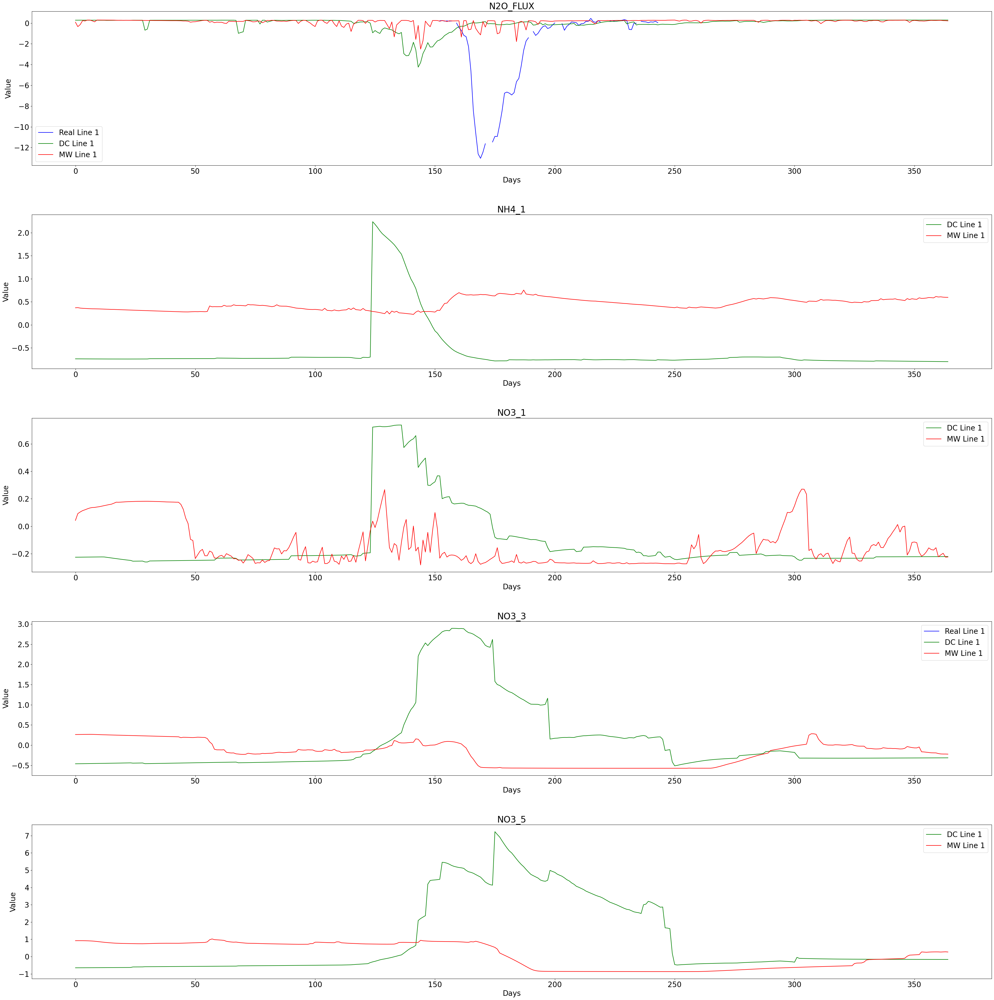

In [40]:
module_name = "Nitrogen"
mw_data = MW_Dataset1(module_name=module_name)
dc_data = DayCent_Dataset1(module_name=module_name)

Y_mw = mw_data.y_not_scaled

Y_dc = dc_data.y_not_scaled[:, :1980, :]

Y_combined = np.concatenate((Y_mw, Y_dc), axis=0)

Yscaler = np.zeros((Y_combined.shape[2], 2))

# Apply Z-normalization to the combined Y data
for i in range(Y_combined.shape[2]):
    Y_combined[:, :, i], Yscaler[i, 0], Yscaler[i, 1] = Z_norm(Y_combined[:, :, i])

Y_mw_scaled = Y_combined[:Y_mw.shape[0], :, :]
Y_dc_scaled = Y_combined[Y_mw.shape[0]:, :, :]

# Define file paths
Y_dc_scaled_path = f'data_files/t0_dc/Y_dc_scaled_{module_name}.npy'
Y_mw_scaled_path = f'data_files/t0_mw/Y_mw_scaled_{module_name}.npy'
Y_scaler_path = f'data_files/t0_scalers/Y_scaler_{module_name}.npy'
np.save(Y_scaler_path, Yscaler)
# Save the scaled data
np.save(Y_dc_scaled_path, Y_dc_scaled)
np.save(Y_mw_scaled_path, Y_mw_scaled)

####2nd check plot

# Extract the first place and first three full years (365 days each) from DC and MW datasets
### llc fixed, reshape has problem, please avoid. it will cause temperature seanality change
dc_data_extracted = Y_dc_scaled[365*10:365*11, 10, :] ### llc fixed, fertilizer will be 0 at site 0
mw_data_extracted = Y_mw_scaled[365*10:365*11, 10, :] ###also check Y_train

# Colors for each dataset
colors = ['b', 'g', 'r']  # Colors for the three different lines within each dataset

# Plotting X features that are present in both datasets
plt.rcParams.update({'font.size': 20})
fig, axes = plt.subplots(len(mw_data.Y_feature_names), 1, figsize=(40, 40))
fig.tight_layout(pad=5.0)

x = np.arange(365)
output_names = mw_data.Y_feature_names

for i, ax in enumerate(axes.flatten()):
    for j in range(1):
        feature_name = output_names[i]
        if feature_name in obs_Y_names:
            index = obs_Y_names.index(feature_name)
            ax.plot(x, Y_obs_padded[:, j, index], color=colors[0], label=f'Real Line {j+1}')
        ax.plot(x, dc_data_extracted[:, i], color=colors[1], label=f'DC Line {j+1}')
        ax.plot(x, mw_data_extracted[:, i], color=colors[2], label=f'MW Line {j+1}')
    ax.set_title(feature_name)
    ax.set_xlabel('Days')
    ax.set_ylabel('Value')
    ax.legend()
plt.show()

In [41]:
print(Y_dc_scaled.shape)
print(Y_mw_scaled.shape)

(7665, 1980, 5)
(6570, 1980, 5)
